In [ ]:
import sys
formerPath = sys.path
sys.path.append('./code/')
sys.path.append('./BS/')

In [9]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import sklearn as skl


import bootstrapping
import dataSetConstruction
import backtest
import BS
import loadData
import plotTools
import SSVI


from Bisect import bisect
from newton import newton
from BSImplVol import bsimpvol

import importlib

# Load modules and external files

You need to import four python scripts for implied volatility calibration :
- *newton.py*
- *BSImplVol.py*
- *BS.py*
- *Bisect.py*

In [14]:
%load_ext autoreload
%autoreload 2


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [385]:
#Load python files to google colaborative environment
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

ModuleNotFoundError: No module named 'google.colab'

In [11]:
importlib.reload(loadData)

<module 'loadData' from './code/loadData.py'>

# Load data with google colab 

#### From excel file :

You will find in github repository six days of data.
For each day you need to load six csv files :
- *underlying.csv* for the stock value.
- *locvol.csv* for the local volatility calibrated with tree pricing and tikhonov volatility (see Crépey (2002)).
- *dividend.csv* for dividend extracted from put-call parity.
- *discount.csv* for zero-coupon curve. 
- *dataTrain.csv* for prices and/or implied volatility used in training set.
- *dataTest.csv* for prices and/or implied volatility used in testing set.

In [3]:
#Load csv files to get data
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))
  

ModuleNotFoundError: No module named 'google.colab'

In [16]:
workingFolder = "./data/09082001/"

Bootstrap discounting


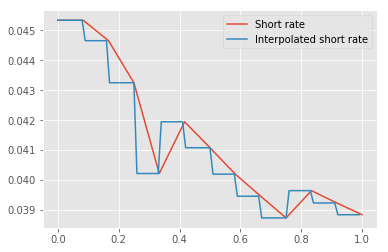

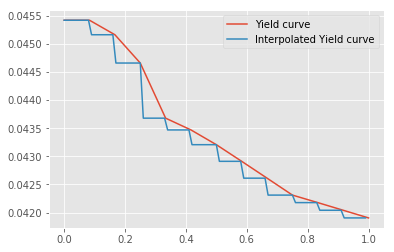

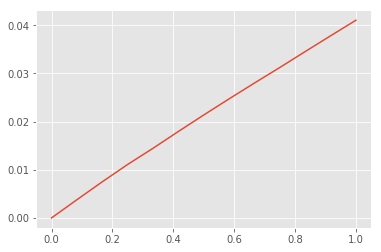

Bootstrap dividend


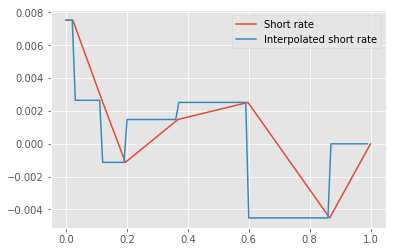

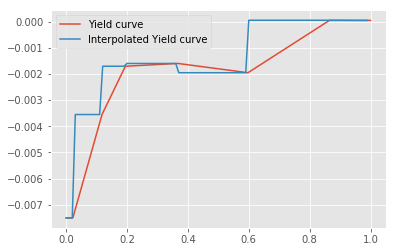

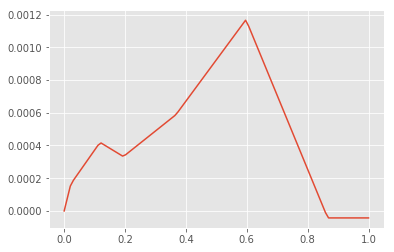

In [17]:
#Read csv files as dataFrames
trainingSet, testingSet, bootstrap, S0 = loadData.loadDataFromCSV(workingFolder,
                                                                  "9_8_2001__filterdax")

#### From Dat files

Tikhonov PDE repricing error on training set :  2.4207935408017573
Bootstrap discounting


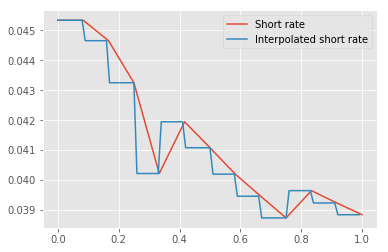

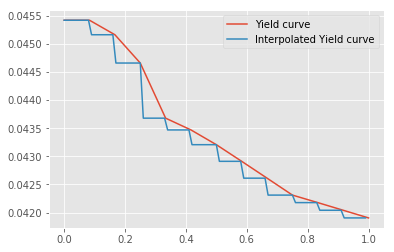

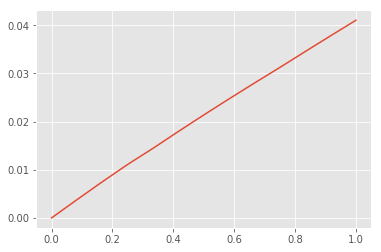

Bootstrap dividend


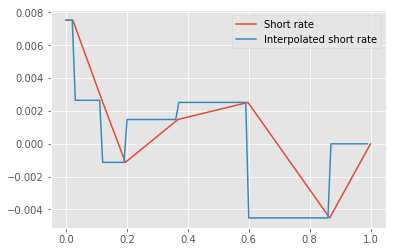

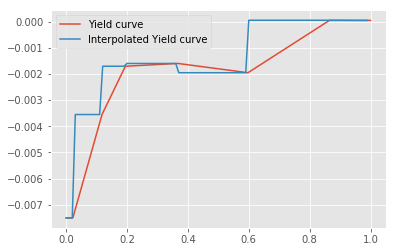

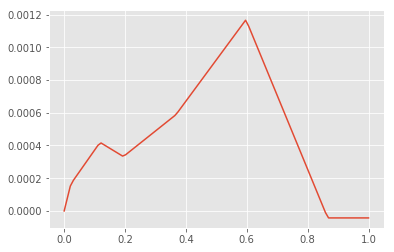

In [18]:
trainingSet, testingSet, bootstrap, S0 = loadData.loadDataFromDat(workingFolder,
                                                                  "9_8_2001__filterdax")

In [19]:
importlib.reload(loadData)

<module 'loadData' from './code/loadData.py'>

In [20]:
pd.options.mode.chained_assignment = 'raise'

#### SPX Data

We assume a piecewise constant discount short rate $r$ and a piecewise constant dividend short rate $q$.

We estimate the "zero coupon dividend" $D(T) = e^{-\int_{0}^{T} q_s ds}$ by regressing it against maturity :
$$e^{-\int_{0}^{T} q_s ds} = \frac{C(T,K) - P(T,K) + K e^{-\int_{0}^{T} r_s ds}}{S_0}$$


Then we have $\hat{q}_t = - \frac{ \log{D(\overline{T})} - \log{D(\underline{T})} }{ \overline{T} - \underline{T} }$ with $\overline{T}$ the smallest discretized maturity greater than $T$ and $\underline{T}$ the grestest discretized maturity inferior than $T$.

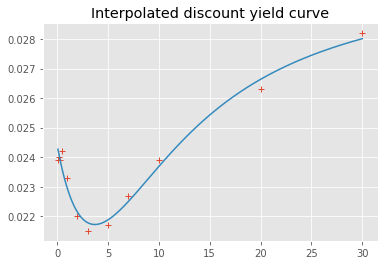

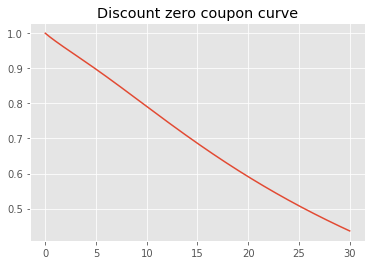

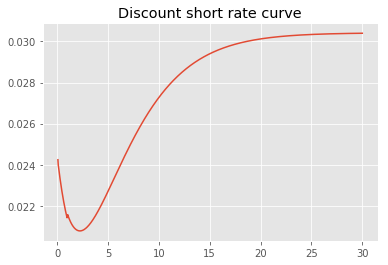

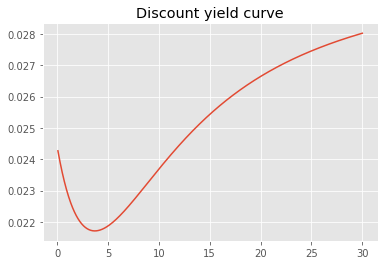

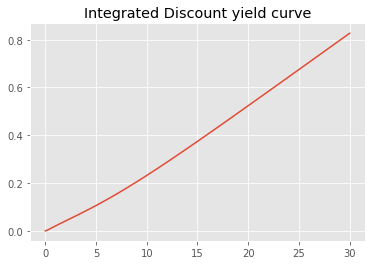

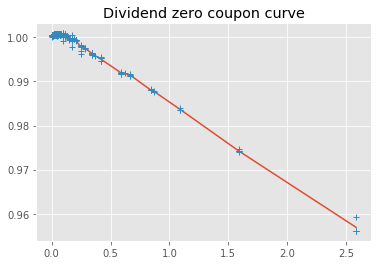

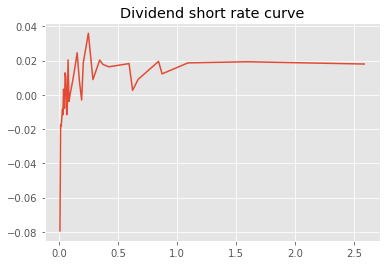

./code/bootstrapping.py:271: RuntimeWarning: invalid value encountered in double_scalars
  return (1 / x - 1) / float(t)


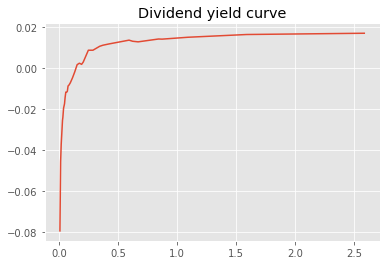

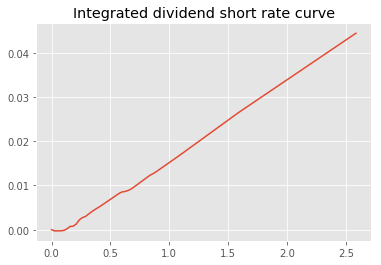

In [21]:
workingFolder = "./data/"
fileName = "Option_SPX_18_Mai_2019Feuille2.xlsm"
asOfDate = "2019-05-18"
trainingSet, testingSet, bootstrap, S0 = loadData.loadCBOTData(workingFolder, fileName, asOfDate)

In [22]:
importlib.reload(bootstrapping)

<module 'bootstrapping' from '/home/chataigner/Téléchargements/LOCVOL/bootstrapping.py'>

####  Eurostoxx data

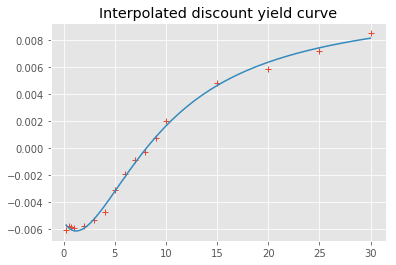

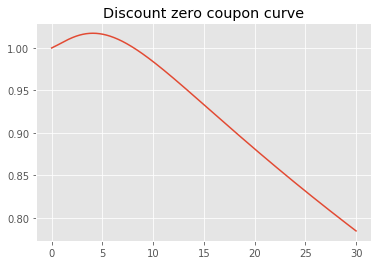

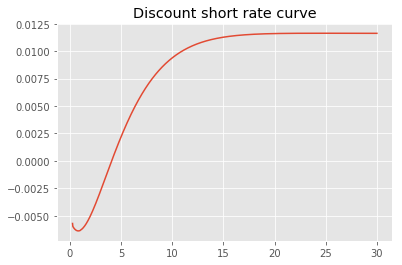

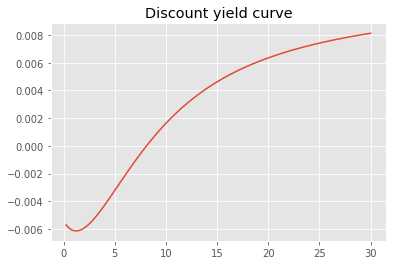

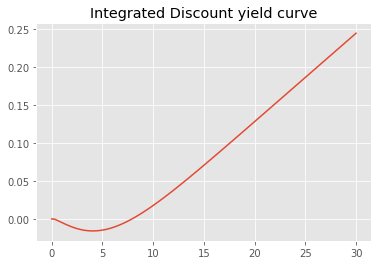

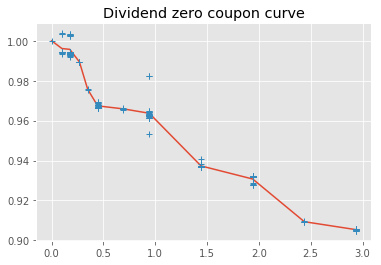

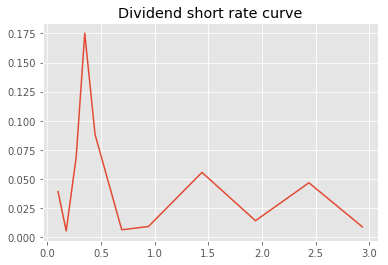

./code/bootstrapping.py:271: RuntimeWarning: invalid value encountered in double_scalars
  return (1 / x - 1) / float(t)


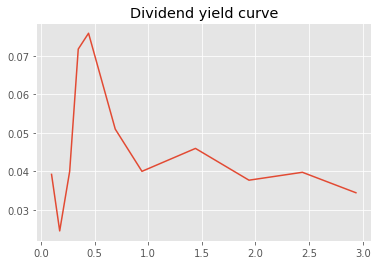

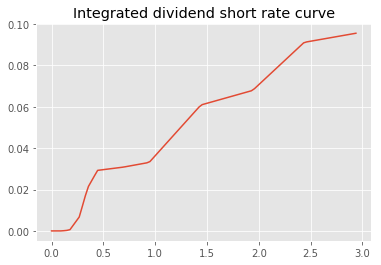

In [22]:
workingFolder = "./data/"
asOfDate = "2019-01-10"
filename = "Data_EuroStoxx50_20190110_all_for_Marc.xlsx"
trainingSet, testingSet, bootstrap, S0 = loadData.loadESXData(workingFolder, filename, asOfDate)

In [23]:
bootstrap.discountShortRate(10)

array(0.009402)

# Formatting data

### Boostsrapping Rate Curve


- For bootstrapping short rate $r$ and dividend rate $q$, we assume piecewise constant short rate for risk free rate and dividend i.e. 
$\exp{(-\int_{0}^{T} r_t d_t)} = \exp{(-\sum_{i} r_i h)}$ and $\exp{(\int_{0}^{T} q_t d_t)} = \exp{(\sum_{i} q_i h)}$.
- $\forall i \in \{0,..,N\}$ with $ t_0 = 0$ and $t_N = T$, we have that $\frac{\log{B(0,t_{i+1})} - \log{B(0,t_i)}}{h} = r_i$ with $B(0,T_i)$ the price of a bond expiring at time $t_i$. 
- For dividend, we just to substitute $B(0,T_i)$ with with spot action price plus dividend cash flow received until time $T_i$ i.e. $S_{t_0} + \sum\limits_i Div_{t_i}$.
- Then we linearly interpolate $r$ and $q$.
-  Linear interpolation is also used for integrals $\int_{0}^{T} q_t d_t$ and $\int_{0}^{T} r_t d_t$ in order to obtain discount factor or dividend factor. 

**riskFreeIntegral** corresponds to $I_T = \int_{0}^{T} r_u du$.
**riskFreeSpline**  corresponds to $r_u$ evaluated on a subgrid. Interpolated as step function from zero coupons

**divSpreadIntegral** corresponds to $I_T = \int_{0}^{T} q_u du$, can be negative.
**divSpline**  corresponds to $q_u$ evaluated on a subgrid, can be negative.

Training dataset is built on market prices observed on the dax.
Testing dataset is list of prices drawn from an excel provided by Stephane Crépey.
Prices come from the calibrated local volatility with tikhonov regularisation (see Crépey 2002 paper).
Implied volatitilities in both dataset are obtained from local volatility.

These curve satisfy together the call put parity.

Spot level is contained in underlying.csv

### Pricing black-scholes price

#### Change of variable

- In presence of dividend rate $d$ and risk free rate $r$ Dupire formula is :   $$\sigma^2(T,K) = 2 \frac{ \partial_T P(T,K) + (r-q) K \partial_K P(T,K) + qP(T,K)}{K² \partial_{K}^2 P(T,K)}$$ 
with Strike $K$, Maturity $T$, dividend rate $q$ and risk-free rate $r$, $P$ our pricing function. 
- We apply the following change of variable : $$ w(T,k) = \exp{(\int_{0}^{T} q_t dt)} P(T,K)$$ with $K = k \exp{(\int_{0}^{T} (r_t - q_t) dt)} $.

- Then Dupire equation becomes :  $\sigma^2(T,K) = 2 \frac{ \partial_T w(T,k)}{k² \partial_{k}^2 w(T,k)}$. 
- If we learn the mapping $v$ with a neural network then we should obtain quickly by adjoint differentiation $\partial_T w$ and $\partial_{k²}^2 w$ and therefore $\sigma$.


In [25]:
def checkCallPutParity(rawData, S0, bootstrap):
    callPrice = rawData[rawData["OptionType"]==1.0]["Price"].sort_index().reset_index()
    putPrice = rawData[rawData["OptionType"]==-1.0]["Price"].sort_index().reset_index()
    mergeDf = pd.merge(callPrice, putPrice, 
                       left_on = ["Maturity", "Strike"], 
                       right_on = ["Maturity", "Strike"], 
                       how="inner")
    
    callPrice = mergeDf["Price_x"]
    putPrice = mergeDf["Price_y"]
    strike = pd.Series(mergeDf["Strike"].values, index=mergeDf.index)
    maturity = pd.Series(mergeDf["Maturity"].values, index=mergeDf.index)
    
    integratedDividend = np.exp(- bootstrap.dividendIntegral(maturity))
    integratedDiscount = np.exp(- bootstrap.discountIntegral(maturity))
    
    callPutForward = (callPrice - putPrice) 
    forward = (S0 * integratedDividend - strike * integratedDiscount)
    relativeError = np.abs((callPutForward - forward) / callPutForward)
    
    
    print("Call put parity max absolute relative error : ", 
          relativeError.max(), " , ", 
          strike[relativeError.idxmax()], " , ", 
          maturity[relativeError.idxmax()])
    print("Call put parity mean absolute relative error : ", 
          relativeError.mean())
    plt.plot(maturity.values,relativeError.values)
    
    tolerance = 1e-4
    if relativeError.max() > tolerance :
        print("Call put parity is violated")
    else : 
        print("Call put parity is respected")
    return

Call put parity max absolute relative error :  46.48747293666371  ,  3050.0  ,  0.175
Call put parity mean absolute relative error :  0.5962202923208038
Call put parity is violated


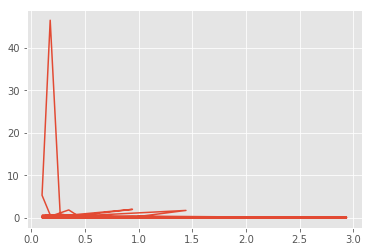

In [26]:
checkCallPutParity(pd.concat([trainingSet, testingSet]), 
                   S0, 
                   bootstrap)

In [27]:
dataSet = trainingSet #Training set
dataSetTest = testingSet #Testing set
dataSet.head()

Price     Delta        Vega   Delta Strike  Gamma Strike  \
Strike Maturity                                                              
1700.0 0.942     1262.0  1.000000    0.000000 -765373.726867   1667.641680   
1850.0 0.099        0.3 -0.000000    0.000000       0.000000      0.000000   
2000.0 0.175     1079.6  0.967598   93.141170      -3.116126      0.004663   
2050.0 0.099        0.5 -0.000000    0.000000       0.000000      0.000000   
       0.942      926.1  0.953206  291.468102      -2.851521      0.004501   

                        Theta  ChangedStrike  DividendFactor  Strike  \
Strike Maturity                                                        
1700.0 0.942    -3.823778e+14    1764.884102        0.967427  1700.0   
1850.0 0.099     0.000000e+00    1850.000000        1.000000  1850.0   
2000.0 0.175    -7.491457e+03    2000.811338        0.999595  2000.0   
2050.0 0.099     0.000000e+00    2050.000000        1.000000  2050.0   
       0.942    -3.315613e+03    2128.242594        0.967427  2050.0   

                 Maturity  ImpliedVol       VegaRef  OptionType  logMoneyness  \
Strike Maturity                                                                 
1700.0 0.942        0.942    0.000001  6.622745e+01         1.0     -0.553671   
1850.0 0.099        0.099    0.000001  2.950182e-07        -1.0     -0.506570   
2000.0 0.175        0.175    0.594325  9.456663e-02         1.0     -0.428203   
2050.0 0.099        0.099    0.000001  5.919073e-04        -1.0     -0.403916   
       0.942        0.942    0.242150  3.140718e+02         1.0     -0.366459   

                 impliedTotalVariance  
Strike Maturity                        
1700.0 0.942             9.420000e-13  
1850.0 0.099             9.900000e-14  
2000.0 0.175             6.181391e-02  
2050.0 0.099             9.900000e-14  
       0.942             5.523556e-02

In [28]:
dataSetTest.head()

Price     Delta        Vega  Delta Strike  Gamma Strike  \
Strike Maturity                                                             
1400.0 0.942     1614.5  0.944808  332.400489     -2.873470      0.003280   
       0.942        4.9 -0.055192  332.400489      0.216138      0.000042   
1600.0 0.942     1417.5  0.931938  391.535896     -2.637271      0.002948   
       0.942        8.5 -0.068062  391.535896      0.228841      0.000054   
1650.0 0.175     1430.7  0.974572   76.141072     -3.430171      0.004599   

                       Theta  ChangedStrike  DividendFactor  Strike  Maturity  \
Strike Maturity                                                                 
1400.0 0.942    -1695.635129    1453.433967        0.967427  1400.0     0.942   
       0.942      132.507772    1453.433967        0.967427  1400.0     0.942   
1600.0 0.942    -1694.543253    1661.067390        0.967427  1600.0     0.942   
       0.942      149.938876    1661.067390        0.967427  1600.0     0.942   
1650.0 0.175    -6602.027687    1650.669354        0.999595  1650.0     0.175   

                 ImpliedVol    VegaRef  OptionType  logMoneyness  \
Strike Maturity                                                    
1400.0 0.942       0.587576   7.028684         1.0     -0.747827   
       0.942       0.587576   7.028684        -1.0     -0.747827   
1600.0 0.942       0.509047  35.214047         1.0     -0.614295   
       0.942       0.509047  35.214047        -1.0     -0.614295   
1650.0 0.175       0.834249   0.000008         1.0     -0.620575   

                 impliedTotalVariance  
Strike Maturity                        
1400.0 0.942                 0.325221  
       0.942                 0.325221  
1600.0 0.942                 0.244100  
       0.942                 0.244100  
1650.0 0.175                 0.121795

In [29]:
dfCurve = dataSetConstruction.savingData(bootstrap, 
                                         dataSet, 
                                         dataSetTest, 
                                         workingFolder)

Saving bootstrapping under dfCurve.csv
Saving training set under trainingDataSet.csv
Saving bootstrapping under testingDataSet.csv


In [30]:
dataSet.shape

(67, 15)

In [31]:
dataSetTest.shape

(218, 15)

In [32]:
S0

3070.24

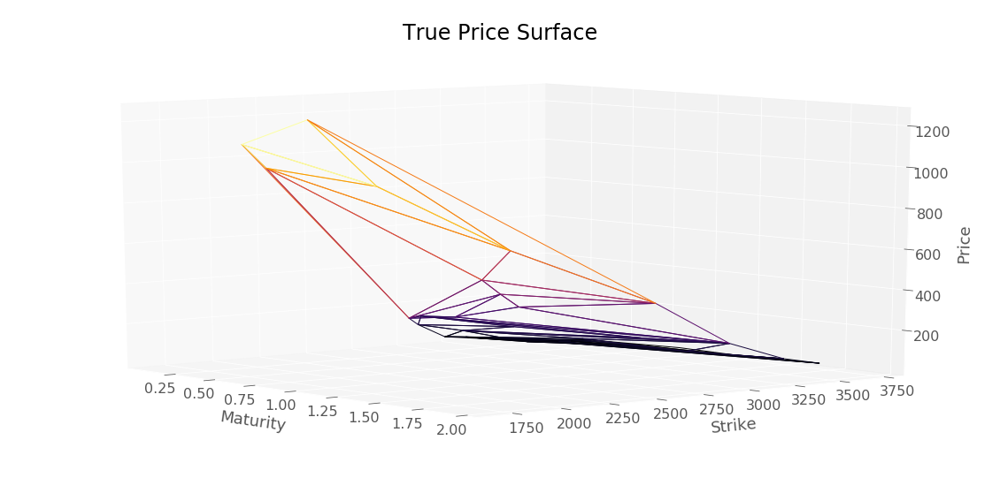

In [33]:
def getCall(df):
    return df[df["OptionType"]==1]
def getPut(df):
    return df[df["OptionType"]==-1]
    
plotTools.plotSerie(getCall(trainingSet)["Price"], 
                    yMin=0,
                    yMax=3*S0, 
                    Title = 'True Price Surface')

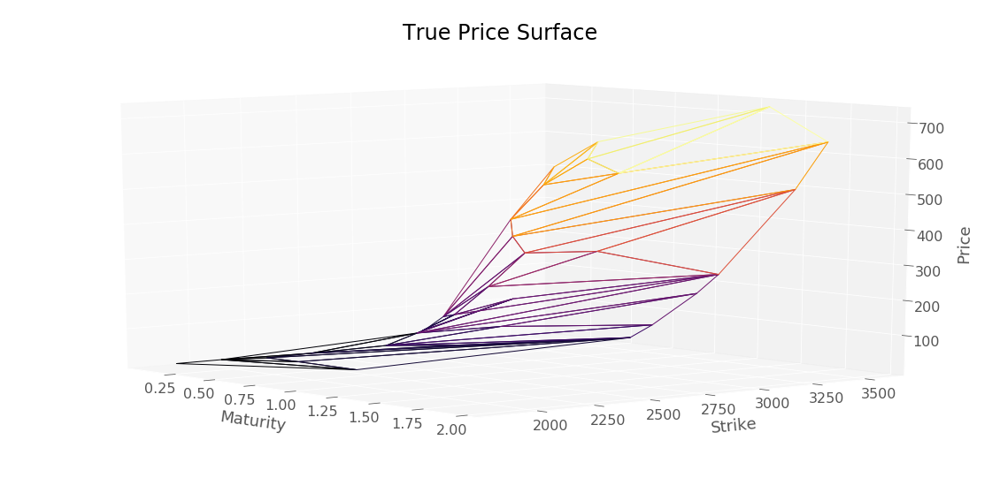

In [34]:
plotTools.plotSerie(getPut(trainingSet)["Price"], 
                    yMin=0,
                    yMax=3*S0, 
                    Title = 'True Price Surface')

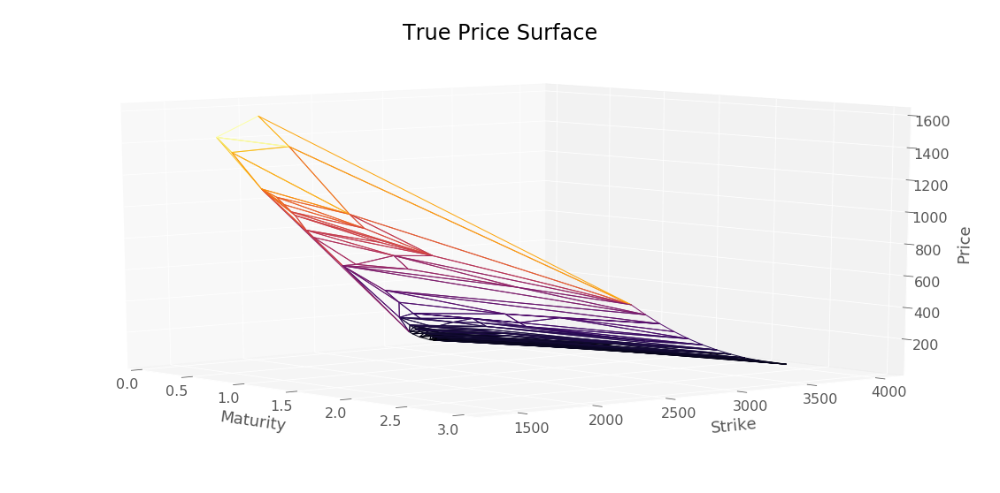

In [35]:
plotTools.plotSerie(getCall(testingSet)["Price"], 
                    yMin=0,
                    yMax=3*S0, 
                    Title = 'True Price Surface')

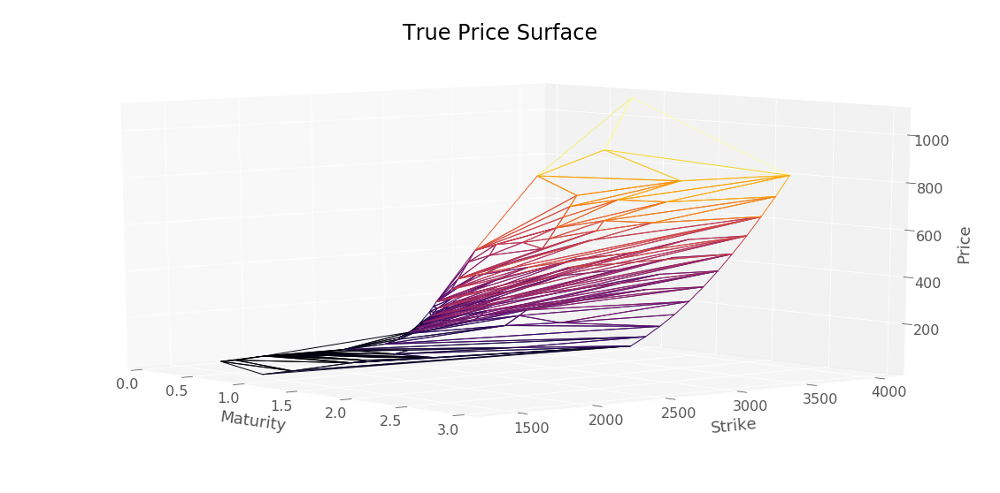

In [36]:
plotTools.plotSerie(getPut(testingSet)["Price"], 
                    yMin=0,
                    yMax=3*S0, 
                    Title = 'True Price Surface')

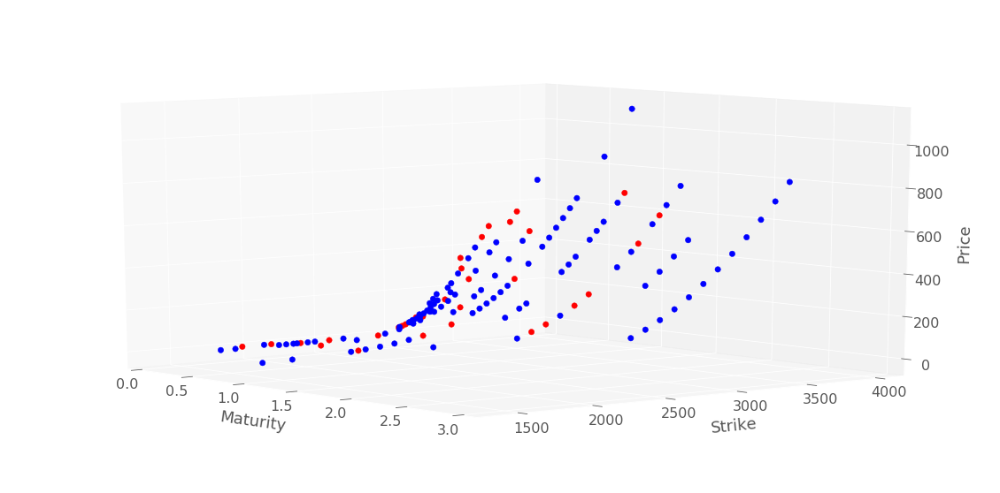

In [37]:
plotTools.plot2Series(getPut(testingSet)["Price"], 
                      getPut(trainingSet)["Price"], 
                      yMin=0,
                      yMax=3*S0, 
                      Title = 'True Price Surface')

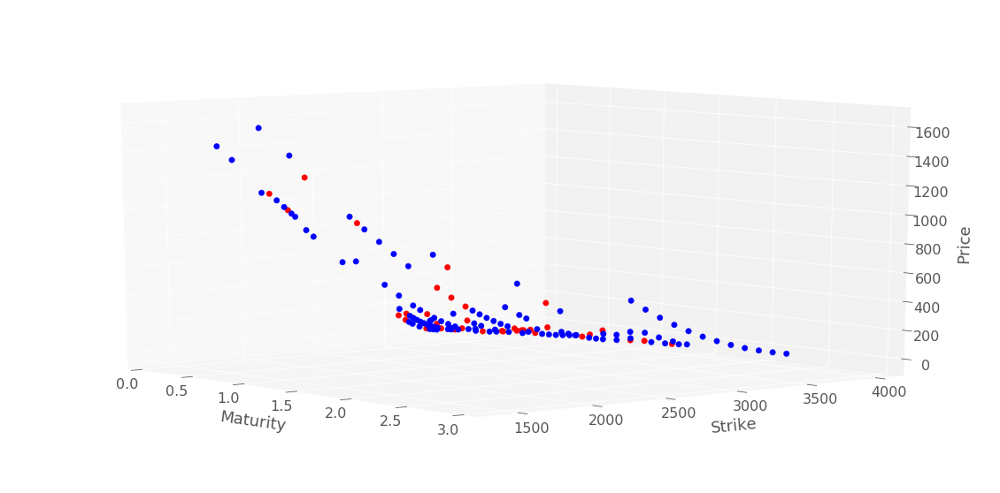

In [38]:
plotTools.plot2Series(getCall(testingSet)["Price"], 
                      getCall(trainingSet)["Price"], 
                      yMin=0,
                      yMax=3*S0,
                      Title = 'True Price Surface')

In [39]:
testingSet.shape

(218, 15)

In [40]:
trainingSet.shape

(67, 15)

In [41]:
dataSet.head()

Price     Delta        Vega   Delta Strike  Gamma Strike  \
Strike Maturity                                                              
1700.0 0.942     1262.0  1.000000    0.000000 -765373.726867   1667.641680   
1850.0 0.099        0.3 -0.000000    0.000000       0.000000      0.000000   
2000.0 0.175     1079.6  0.967598   93.141170      -3.116126      0.004663   
2050.0 0.099        0.5 -0.000000    0.000000       0.000000      0.000000   
       0.942      926.1  0.953206  291.468102      -2.851521      0.004501   

                        Theta  ChangedStrike  DividendFactor  Strike  \
Strike Maturity                                                        
1700.0 0.942    -3.823778e+14    1764.884102        0.967427  1700.0   
1850.0 0.099     0.000000e+00    1850.000000        1.000000  1850.0   
2000.0 0.175    -7.491457e+03    2000.811338        0.999595  2000.0   
2050.0 0.099     0.000000e+00    2050.000000        1.000000  2050.0   
       0.942    -3.315613e+03    2128.242594        0.967427  2050.0   

                 Maturity  ImpliedVol       VegaRef  OptionType  logMoneyness  \
Strike Maturity                                                                 
1700.0 0.942        0.942    0.000001  6.622745e+01         1.0     -0.553671   
1850.0 0.099        0.099    0.000001  2.950182e-07        -1.0     -0.506570   
2000.0 0.175        0.175    0.594325  9.456663e-02         1.0     -0.428203   
2050.0 0.099        0.099    0.000001  5.919073e-04        -1.0     -0.403916   
       0.942        0.942    0.242150  3.140718e+02         1.0     -0.366459   

                 impliedTotalVariance  
Strike Maturity                        
1700.0 0.942             9.420000e-13  
1850.0 0.099             9.900000e-14  
2000.0 0.175             6.181391e-02  
2050.0 0.099             9.900000e-14  
       0.942             5.523556e-02

## Scaling methods

Use min-max of scaling strike between 0 et 1 for improving stability of neural network training. 

In [42]:
activateScaling = False
transformCustom = dataSetConstruction.transformCustomMinMax if activateScaling else dataSetConstruction.transformCustomId
inverseTransform = dataSetConstruction.inverseTransformMinMax if activateScaling else dataSetConstruction.inverseTransformId
inverseTransformColumn = dataSetConstruction.inverseTransformColumnMinMax if activateScaling else dataSetConstruction.inverseTransformColumnId
inverseTransformColumnGreeks = dataSetConstruction.inverseTransformColumnGreeksMinMax if activateScaling else dataSetConstruction.inverseTransformColumnGreeksId

In [43]:
scaler = skl.preprocessing.MinMaxScaler(feature_range=(0, 1))
scaler.fit(dataSet)
scaledDataSet = transformCustom(dataSet, scaler)
scaledDataSetTest = transformCustom(dataSetTest, scaler)

In [44]:
scaledDataSet.head()

Price     Delta        Vega   Delta Strike  Gamma Strike  \
Strike Maturity                                                              
1700.0 0.942     1262.0  1.000000    0.000000 -765373.726867   1667.641680   
1850.0 0.099        0.3 -0.000000    0.000000       0.000000      0.000000   
2000.0 0.175     1079.6  0.967598   93.141170      -3.116126      0.004663   
2050.0 0.099        0.5 -0.000000    0.000000       0.000000      0.000000   
       0.942      926.1  0.953206  291.468102      -2.851521      0.004501   

                        Theta  ChangedStrike  DividendFactor  Strike  \
Strike Maturity                                                        
1700.0 0.942    -3.823778e+14    1764.884102        0.967427  1700.0   
1850.0 0.099     0.000000e+00    1850.000000        1.000000  1850.0   
2000.0 0.175    -7.491457e+03    2000.811338        0.999595  2000.0   
2050.0 0.099     0.000000e+00    2050.000000        1.000000  2050.0   
       0.942    -3.315613e+03    2128.242594        0.967427  2050.0   

                 Maturity  ImpliedVol       VegaRef  OptionType  logMoneyness  \
Strike Maturity                                                                 
1700.0 0.942        0.942    0.000001  6.622745e+01         1.0     -0.553671   
1850.0 0.099        0.099    0.000001  2.950182e-07        -1.0     -0.506570   
2000.0 0.175        0.175    0.594325  9.456663e-02         1.0     -0.428203   
2050.0 0.099        0.099    0.000001  5.919073e-04        -1.0     -0.403916   
       0.942        0.942    0.242150  3.140718e+02         1.0     -0.366459   

                 impliedTotalVariance  
Strike Maturity                        
1700.0 0.942             9.420000e-13  
1850.0 0.099             9.900000e-14  
2000.0 0.175             6.181391e-02  
2050.0 0.099             9.900000e-14  
       0.942             5.523556e-02

In [45]:
#Search strike for ATM option
midS0 = dataSet[dataSet.index.get_level_values("Strike") >= S0].index.get_level_values("Strike").min()

## Plot functions

In [46]:
KMin = 0#0.7 * S0[0]
KMax = 2.0 * S0#1.3 * S0[0]


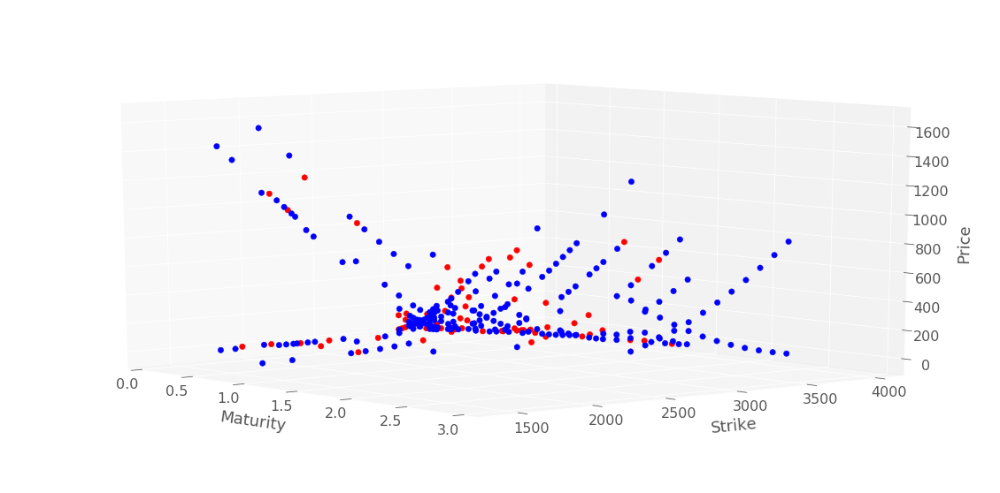

In [48]:
plotTools.plot2Series(dataSetTest[dataSetTest.Maturity > 0]["Price"], 
                      dataSet[dataSet.Maturity > 0]["Price"], 
                      yMin=KMin,
                      yMax=KMax, 
                      Title = 'True Price Surface')

In [49]:
importlib.reload(plotTools)

<module 'plotTools' from './code/plotTools.py'>

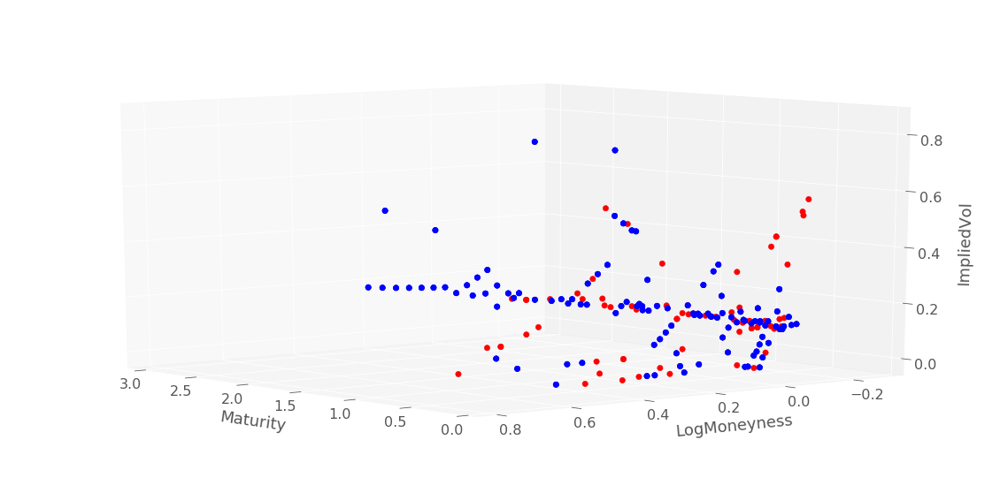

In [50]:
plotTools.plot2Series(plotTools.convertToLogMoneyness(dataSetTest[dataSetTest.Maturity > 0], S0)["ImpliedVol"], 
                      plotTools.convertToLogMoneyness(dataSet[dataSet.Maturity > 0], S0)["ImpliedVol"], 
                      yMin=-1000,
                      yMax=1000, 
                      Title = 'True Implied vol Surfaces', 
                      az=140)

In [51]:
plt.get_cmap("plasma")(0)

(0.050383, 0.029803, 0.527975, 1.0)

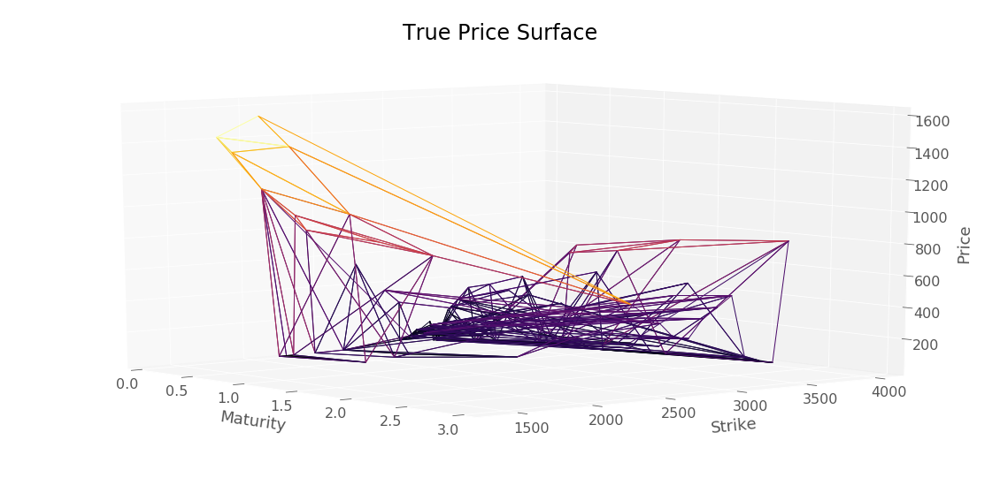

In [52]:
plotTools.plotSerie(dataSetTest[dataSetTest.Maturity > 0]["Price"], 
                    yMin=KMin,
                    yMax=KMax, 
                    Title = 'True Price Surface')

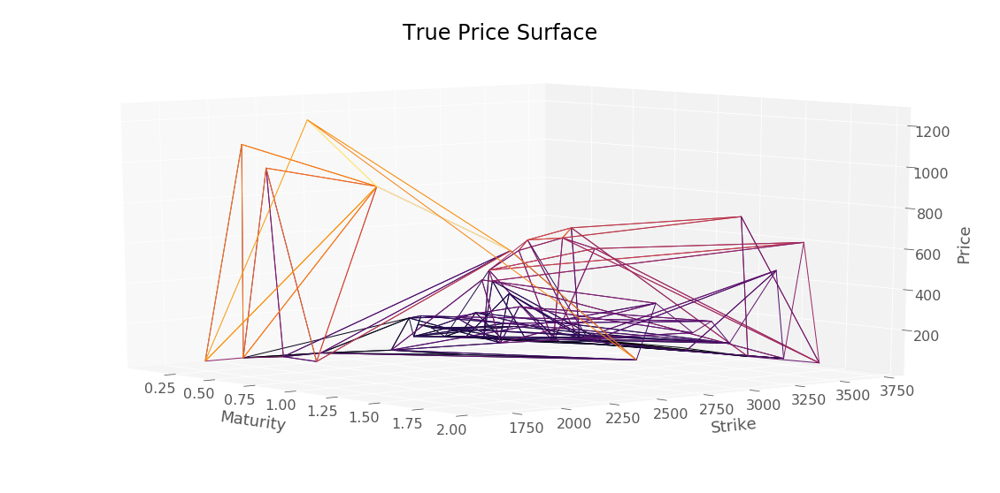

In [53]:
plotTools.plotSerie(dataSet["Price"],
                    yMin=KMin,
                    yMax=KMax, 
                    Title = 'True Price Surface')

In [54]:
inverseTransform(scaledDataSet, scaler).head()

Price     Delta        Vega   Delta Strike  Gamma Strike  \
Strike Maturity                                                              
1700.0 0.942     1262.0  1.000000    0.000000 -765373.726867   1667.641680   
1850.0 0.099        0.3 -0.000000    0.000000       0.000000      0.000000   
2000.0 0.175     1079.6  0.967598   93.141170      -3.116126      0.004663   
2050.0 0.099        0.5 -0.000000    0.000000       0.000000      0.000000   
       0.942      926.1  0.953206  291.468102      -2.851521      0.004501   

                        Theta  ChangedStrike  DividendFactor  Strike  \
Strike Maturity                                                        
1700.0 0.942    -3.823778e+14    1764.884102        0.967427  1700.0   
1850.0 0.099     0.000000e+00    1850.000000        1.000000  1850.0   
2000.0 0.175    -7.491457e+03    2000.811338        0.999595  2000.0   
2050.0 0.099     0.000000e+00    2050.000000        1.000000  2050.0   
       0.942    -3.315613e+03    2128.242594        0.967427  2050.0   

                 Maturity  ImpliedVol       VegaRef  OptionType  logMoneyness  \
Strike Maturity                                                                 
1700.0 0.942        0.942    0.000001  6.622745e+01         1.0     -0.553671   
1850.0 0.099        0.099    0.000001  2.950182e-07        -1.0     -0.506570   
2000.0 0.175        0.175    0.594325  9.456663e-02         1.0     -0.428203   
2050.0 0.099        0.099    0.000001  5.919073e-04        -1.0     -0.403916   
       0.942        0.942    0.242150  3.140718e+02         1.0     -0.366459   

                 impliedTotalVariance  
Strike Maturity                        
1700.0 0.942             9.420000e-13  
1850.0 0.099             9.900000e-14  
2000.0 0.175             6.181391e-02  
2050.0 0.099             9.900000e-14  
       0.942             5.523556e-02

### Implied volatility function calibration by bissection

In [55]:
%matplotlib inline

# SSVI Model

In [56]:
import SSVI


In [57]:
dataSet = dataSet[dataSet["Maturity"] > 0]
dataSetTest = dataSetTest[dataSetTest["Maturity"] > 0]


In [58]:
dataSet.columns

Index(['Price', 'Delta', 'Vega', 'Delta Strike', 'Gamma Strike', 'Theta',
       'ChangedStrike', 'DividendFactor', 'Strike', 'Maturity', 'ImpliedVol',
       'VegaRef', 'OptionType', 'logMoneyness', 'impliedTotalVariance'],
      dtype='object')

In [59]:
importlib.reload(SSVI)

<module 'SSVI' from './code/SSVI.py'>

In [60]:
#parameters, theta, maturities, pSSVI = SSVI.train_svi_surface(dataSet, S0)
SSVIModel = SSVI.SSVIModel(S0, bootstrap)
SSVIModel.fit(dataSet)

/home/chataigner/anaconda3/lib/python3.7/site-packages/scipy/interpolate/_cubic.py:147: RuntimeWarning: invalid value encountered in true_divide
  mk = (y[1:] - y[:-1]) / hk
/home/chataigner/anaconda3/lib/python3.7/site-packages/scipy/interpolate/_cubic.py:147: RuntimeWarning: divide by zero encountered in true_divide
  mk = (y[1:] - y[:-1]) / hk
/home/chataigner/anaconda3/lib/python3.7/site-packages/scipy/optimize/_minimize.py:520: RuntimeWarning: Method L-BFGS-B cannot handle constraints.
  RuntimeWarning)
./code/SSVI.py:51: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(x)


Parameters of SSVI model :  [0.43228219 1.73506678 0.5       ]
time step 7
time step 6
time step 5
time step 4
time step 3
time step 2
time step 1
time step 0


In [61]:
serie = SSVIModel.eval(dataSetTest)

/home/chataigner/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
/home/chataigner/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
/home/chataigner/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1748: RuntimeWarning: invalid value encountered in greater_equal
  cond2 = (x >= self.b) & cond0


/home/chataigner/anaconda3/lib/python3.7/site-packages/matplotlib/colors.py:512: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


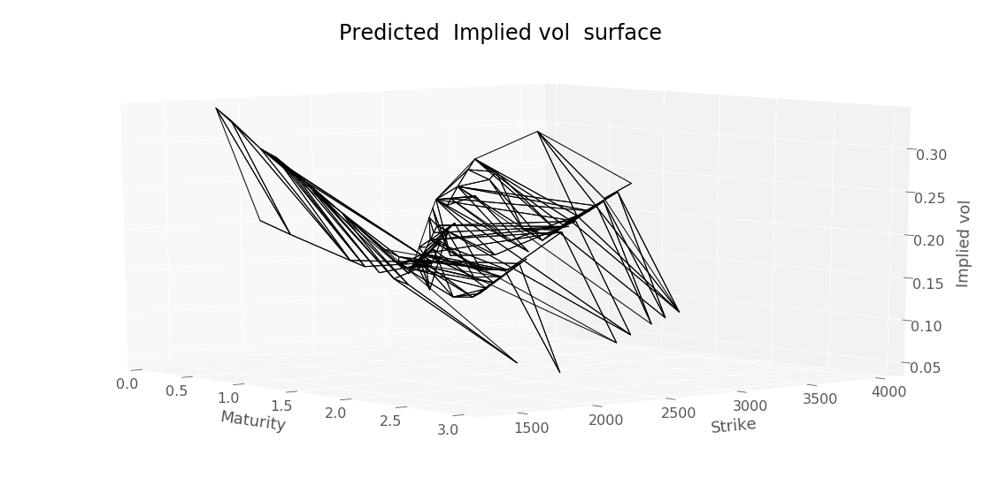

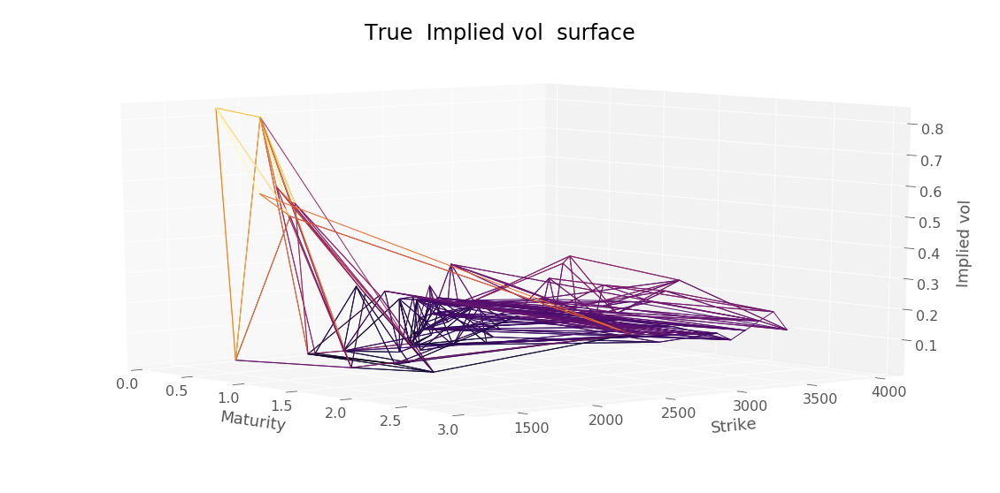

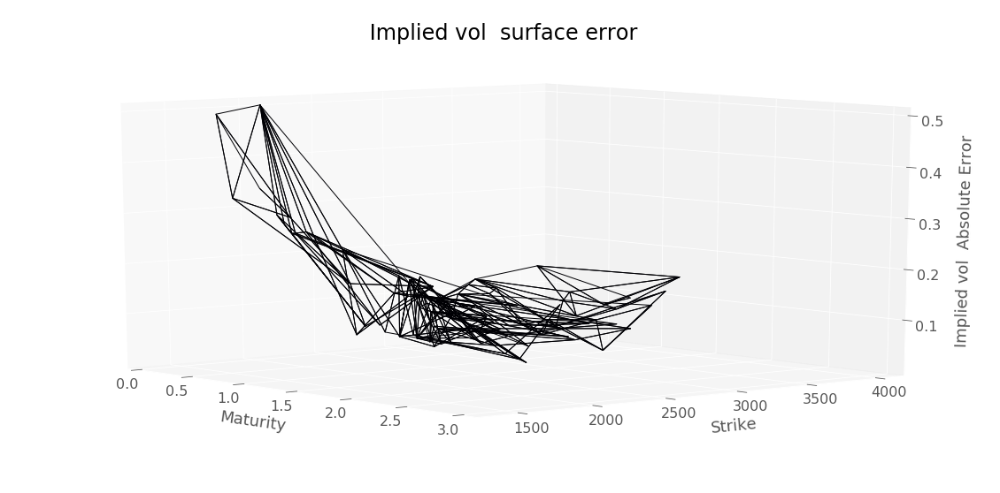

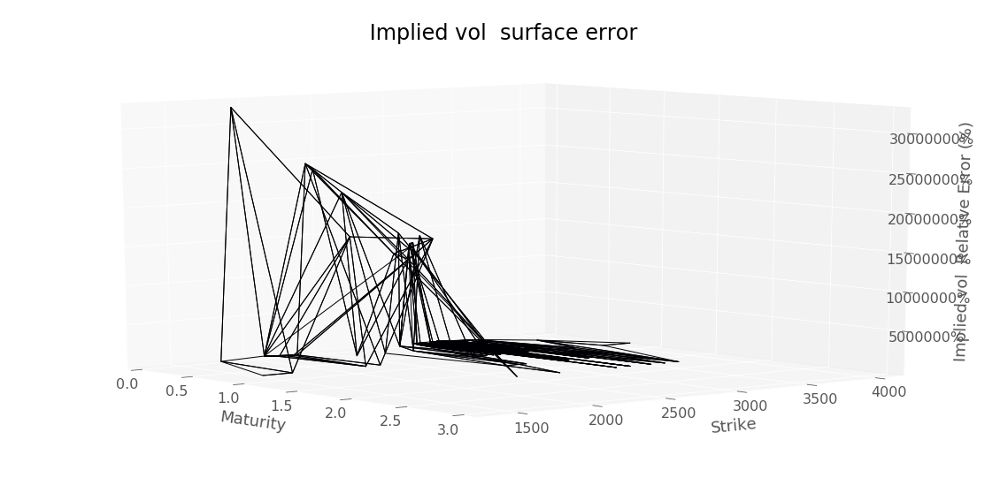

RMSE :  0.14327339179210097


In [62]:
plotTools.predictionDiagnosis(serie, 
                              dataSetTest[dataSetTest["Maturity"] > 0]["ImpliedVol"], 
                              " Implied vol ", 
                              yMin=KMin,
                              yMax=KMax)

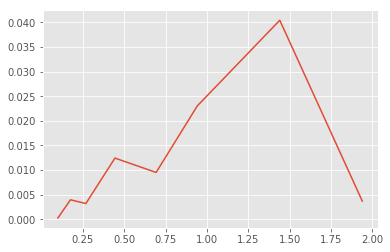

In [63]:
plt.plot(SSVIModel.maturities, SSVIModel.theta)#np.sqrt(theta/maturities))#theta)

In [64]:
dataSet[abs(dataSet.logMoneyness)<=0.01].ImpliedVol

Strike  Maturity
2950.0  0.693       0.038638
3075.0  0.099       0.050940
Name: ImpliedVol, dtype: float64

In [65]:

serieDf = SSVIModel.eval(dataSetTest)

./code/SSVI.py:51: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(x)
/home/chataigner/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
/home/chataigner/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
/home/chataigner/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1748: RuntimeWarning: invalid value encountered in greater_equal
  cond2 = (x >= self.b) & cond0


/home/chataigner/anaconda3/lib/python3.7/site-packages/matplotlib/colors.py:512: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


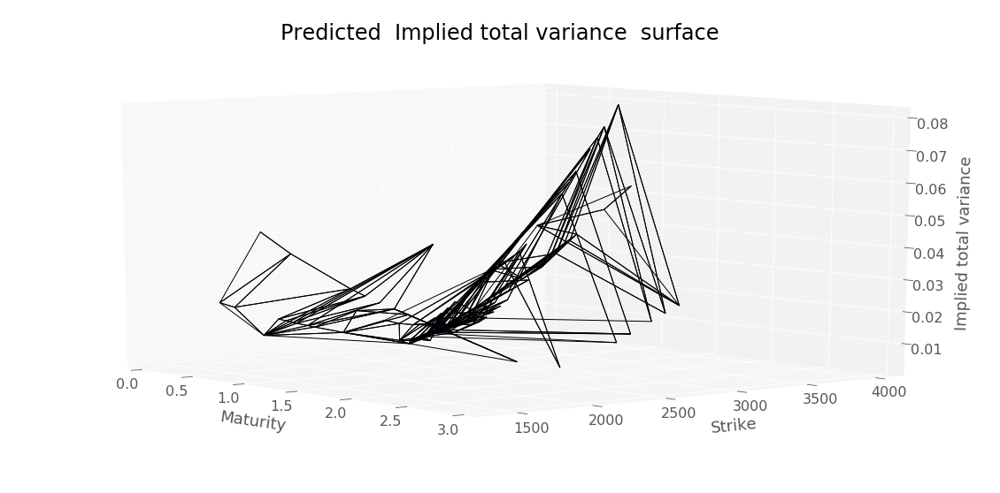

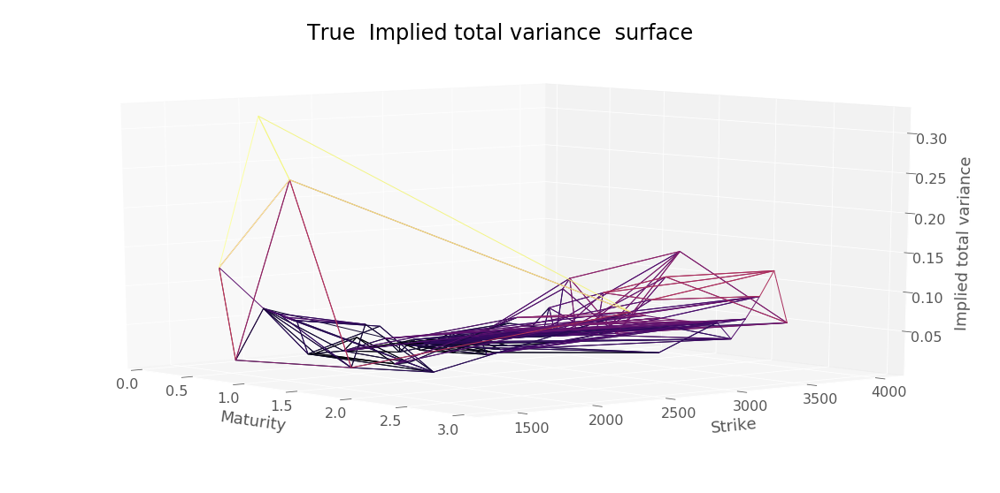

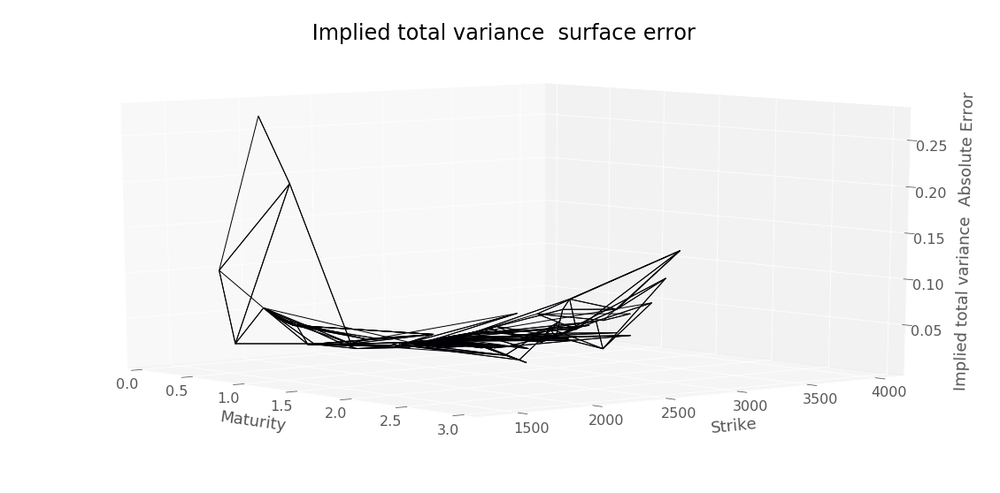

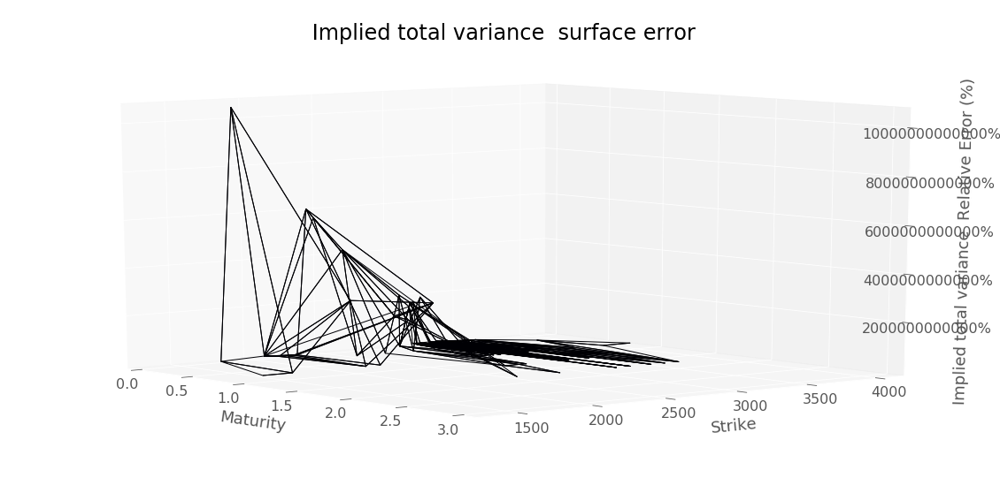

RMSE :  0.04685789787126914


In [66]:
plotTools.predictionDiagnosis(SSVI.impliedVariance(serieDf), 
                              SSVI.impliedVariance(dataSetTest[dataSetTest["Maturity"] > 0]["ImpliedVol"]), 
                              " Implied total variance ", 
                              yMin=KMin, 
                              yMax=KMax)

/home/chataigner/anaconda3/lib/python3.7/site-packages/matplotlib/colors.py:512: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


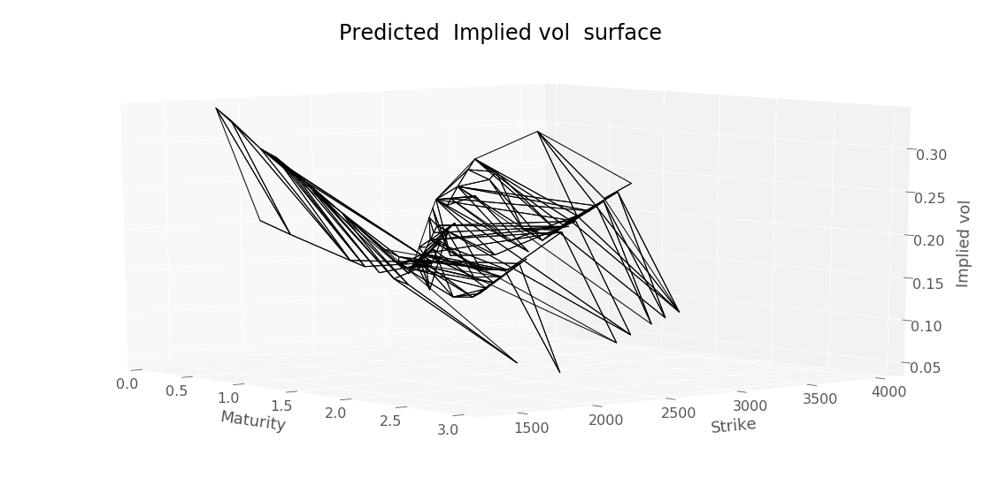

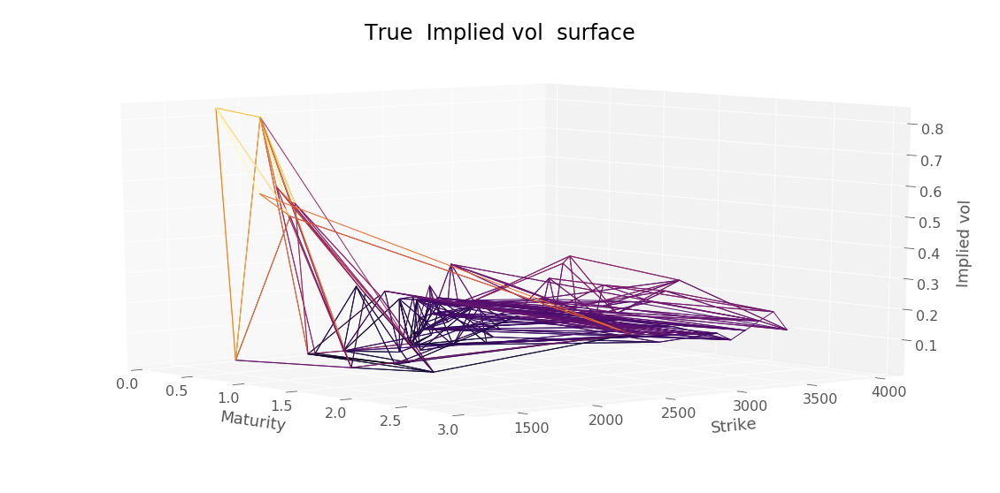

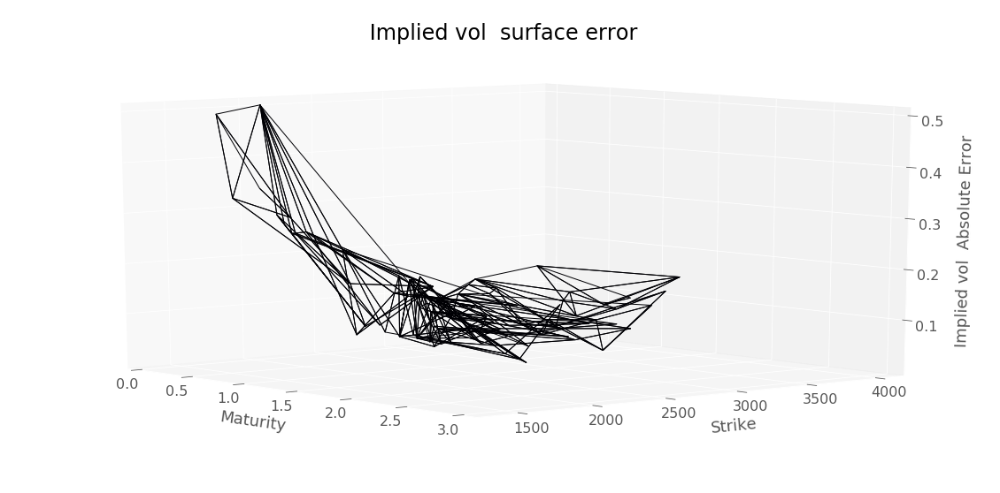

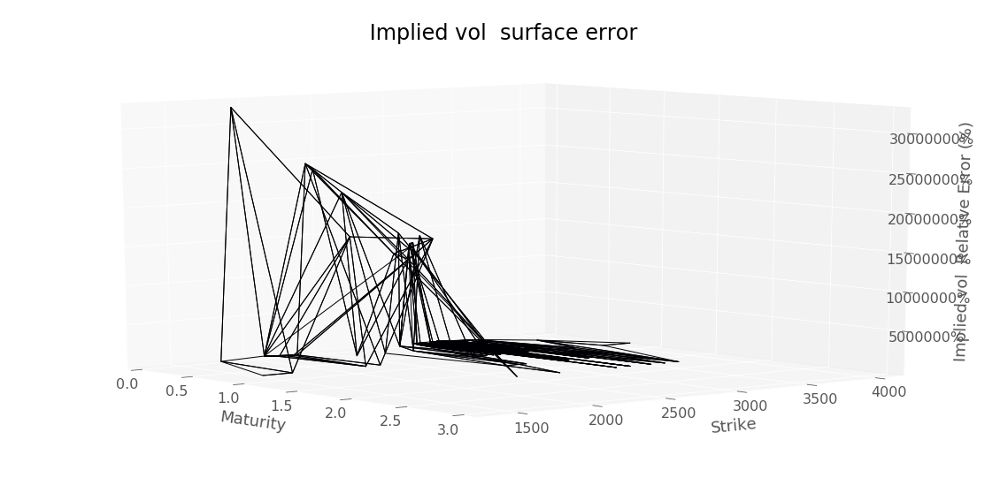

RMSE :  0.14327339179210097


In [67]:
plotTools.predictionDiagnosis(serieDf, 
                              dataSetTest[dataSetTest["Maturity"] > 0]["ImpliedVol"], 
                              " Implied vol ", 
                              yMin=KMin, 
                              yMax=KMax)

In [68]:
importlib.reload(plotTools)

<module 'plotTools' from './code/plotTools.py'>

In [69]:
dataSet.head(20)

Price     Delta         Vega   Delta Strike  Gamma Strike  \
Strike Maturity                                                               
1700.0 0.942     1262.0  1.000000     0.000000 -765373.726867   1667.641680   
1850.0 0.099        0.3 -0.000000     0.000000       0.000000      0.000000   
2000.0 0.175     1079.6  0.967598    93.141170      -3.116126      0.004663   
2050.0 0.099        0.5 -0.000000     0.000000       0.000000      0.000000   
       0.942      926.1  0.953206   291.468102      -2.851521      0.004501   
       0.942       23.8 -0.046794   291.468102       0.105702      0.000002   
2125.0 0.175      956.0  0.960201   110.227033      -2.945339      0.004621   
2150.0 0.444       10.2 -0.000000     0.000000       0.000000      0.000000   
2200.0 0.175        2.1 -0.000000     0.000000       0.000000      0.000000   
2300.0 1.441      641.4  0.840159   896.157863      -1.874045      0.002612   
2400.0 0.175        4.3 -0.000000     0.000000       0.000000      0.000000   
2500.0 0.942       69.0 -0.000000     0.000000       0.000000      0.000000   
       1.940      149.7 -0.000000     0.000000       0.000000      0.000000   
2550.0 0.444       35.3 -0.000000     0.000000       0.000000      0.000000   
2600.0 0.942      433.7  0.783901   873.268363      -1.625579      0.002667   
       1.940      179.6 -0.000000     0.000000       0.000000      0.000000   
       1.940      413.8  1.000000     0.000000  -66839.787530    583.630842   
2700.0 0.942      112.0 -0.000000     0.000000       0.000000      0.000000   
       0.942      355.9  1.000000     0.000000  -98639.730871    803.058096   
2800.0 0.942      285.0  0.657813  1094.524493      -1.194402      0.001898   

                        Theta  ChangedStrike  DividendFactor  Strike  \
Strike Maturity                                                        
1700.0 0.942    -3.823778e+14    1764.884102        0.967427  1700.0   
1850.0 0.099     0.000000e+00    1850.000000        1.000000  1850.0   
2000.0 0.175    -7.491457e+03    2000.811338        0.999595  2000.0   
2050.0 0.099     0.000000e+00    2050.000000        1.000000  2050.0   
       0.942    -3.315613e+03    2128.242594        0.967427  2050.0   
       0.942     7.977907e+01    2128.242594        0.967427  2050.0   
2125.0 0.175    -7.073368e+03    2125.862047        0.999595  2125.0   
2150.0 0.444     0.000000e+00    2216.488057        0.971151  2150.0   
2200.0 0.175     0.000000e+00    2200.892472        0.999595  2200.0   
2300.0 1.441    -1.063826e+03    2462.576389        0.940936  2300.0   
2400.0 0.175     0.000000e+00    2400.973606        0.999595  2400.0   
2500.0 0.942     0.000000e+00    2595.417798        0.967427  2500.0   
       1.940     0.000000e+00    2703.058422        0.934337  2500.0   
2550.0 0.444     0.000000e+00    2628.857929        0.971151  2550.0   
2600.0 0.942    -8.969695e+02    2699.234509        0.967427  2600.0   
       1.940     0.000000e+00    2811.180758        0.934337  2600.0   
       1.940    -3.948198e+12    2811.180758        0.934337  2600.0   
2700.0 0.942     0.000000e+00    2803.051221        0.967427  2700.0   
       0.942    -1.287055e+13    2803.051221        0.967427  2700.0   
2800.0 0.942    -3.174575e+02    2906.867933        0.967427  2800.0   

                 Maturity    ImpliedVol       VegaRef  OptionType  \
Strike Maturity                                                     
1700.0 0.942        0.942  1.000000e-06  6.622745e+01         1.0   
1850.0 0.099        0.099  1.000000e-06  2.950182e-07        -1.0   
2000.0 0.175        0.175  5.943251e-01  9.456663e-02         1.0   
2050.0 0.099        0.099  1.000000e-06  5.919073e-04        -1.0   
       0.942        0.942  2.421497e-01  3.140718e+02         1.0   
       0.942        0.942  2.421497e-01  3.140718e+02        -1.0   
2125.0 0.175        0.175  5.354453e-01  8.845281e-01         1.0   
2150.0 0.444        0.444  1.000000e-06  1.020350e+02        -1.0   
2200

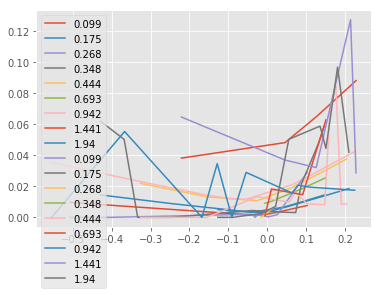

In [70]:
#interpolationBind = lambda x : SSVI.interpolateGrid(x, parameters, 
#                                                    theta, 
#                                                    maturities, 
#                                                    interestrate_theta,
#                                                    forward_theta,
#                                                    S0,
#                                                    bootstrap)
interpolationBind = lambda x : SSVIModel.eval(x)
plotTools.plotEachSmilePred(dataSet, interpolationBind)
plotTools.plotEachSmile(dataSet)
plt.show()

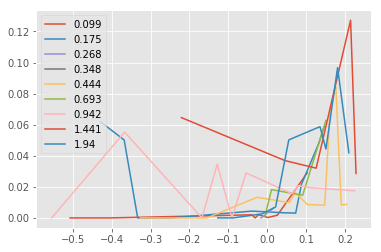

In [71]:
plotTools.plotEachSmile(dataSet)
plt.show()

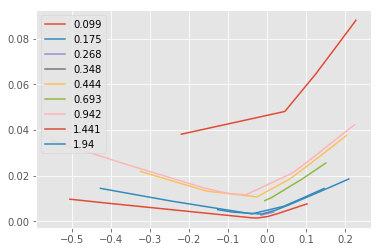

In [72]:
plotTools.plotEachSmilePred(dataSet, interpolationBind)
plt.show()

./code/SSVI.py:51: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(x)
/home/chataigner/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
/home/chataigner/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
/home/chataigner/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1748: RuntimeWarning: invalid value encountered in greater_equal
  cond2 = (x >= self.b) & cond0


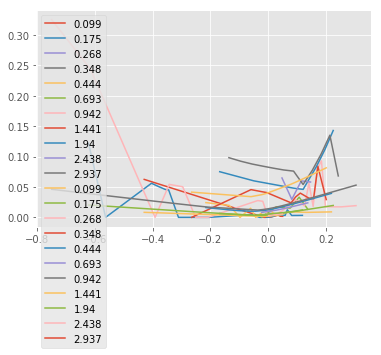

In [73]:
plotTools.plotEachSmile(dataSetTest)
plotTools.plotEachSmilePred(dataSetTest, interpolationBind)
plt.show()

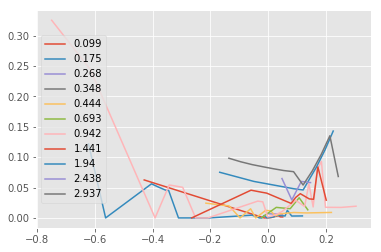

In [74]:
plotTools.plotEachSmile(dataSetTest)
plt.show()

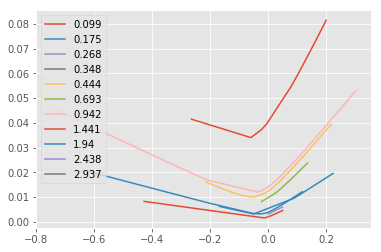

In [75]:
plotTools.plotEachSmilePred(dataSetTest, interpolationBind)
plt.show()

In [76]:
#dT, hk, dK, locVolSSVI, density = finiteDifferenceSVI(dataSet, interpolateWithSSVI)
dT, hk, dK, locVolSSVI, density = SSVI.finiteDifferenceSVI(dataSetTest, interpolationBind)

./code/SSVI.py:1019: RuntimeWarning: invalid value encountered in sqrt
  locVolGatheral = np.sqrt(dT / numerator)


/home/chataigner/anaconda3/lib/python3.7/site-packages/matplotlib/colors.py:512: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


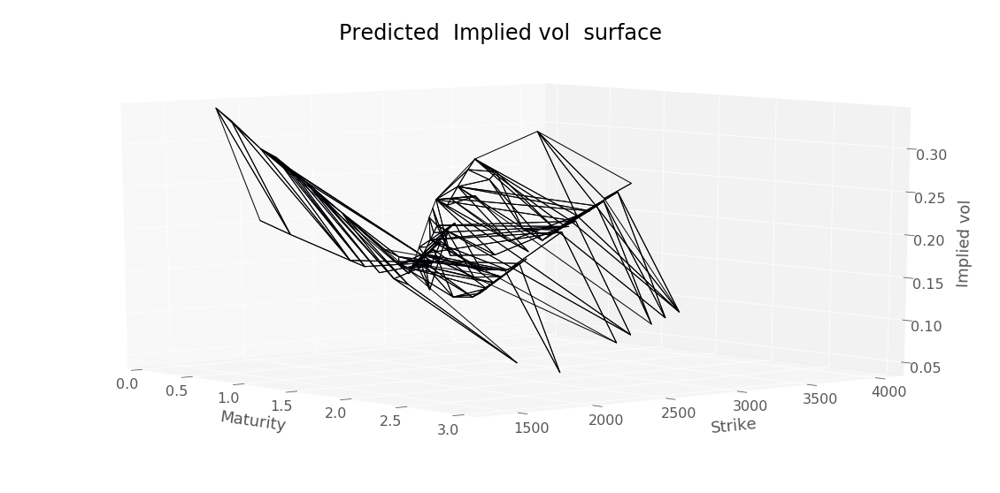

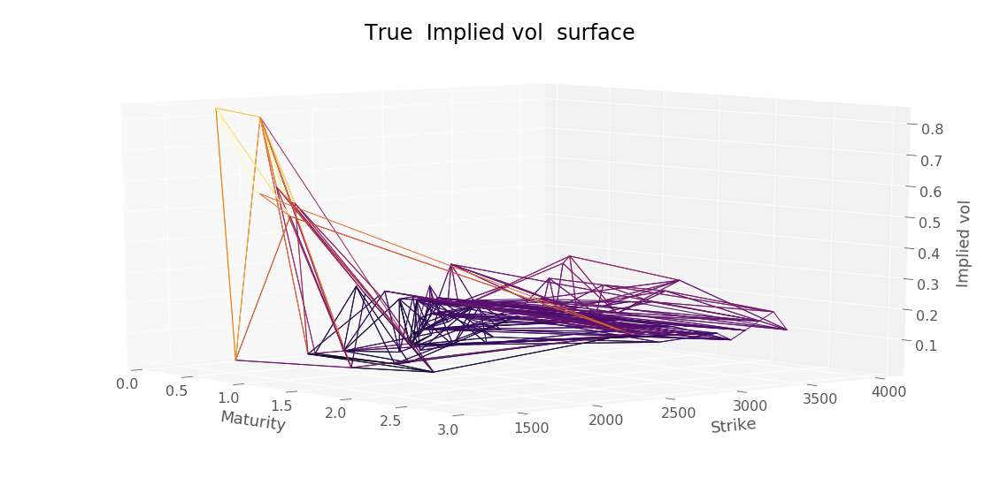

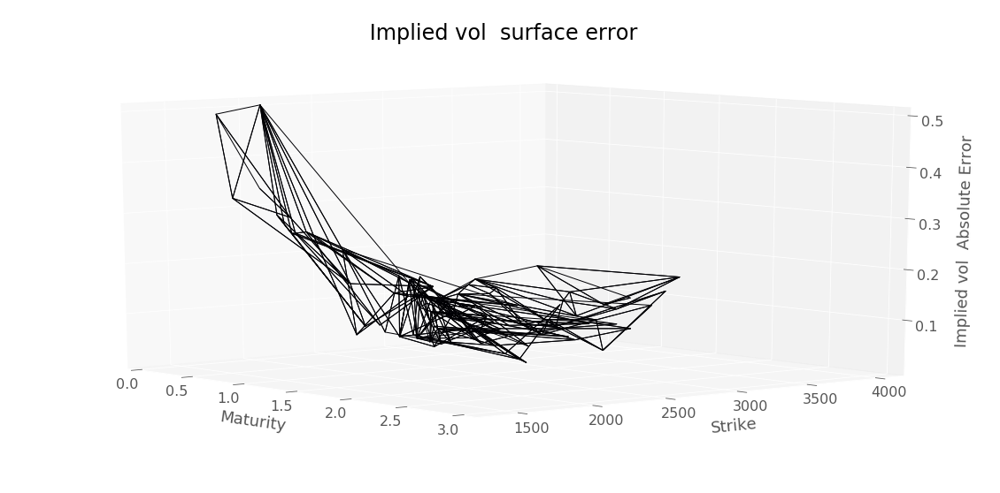

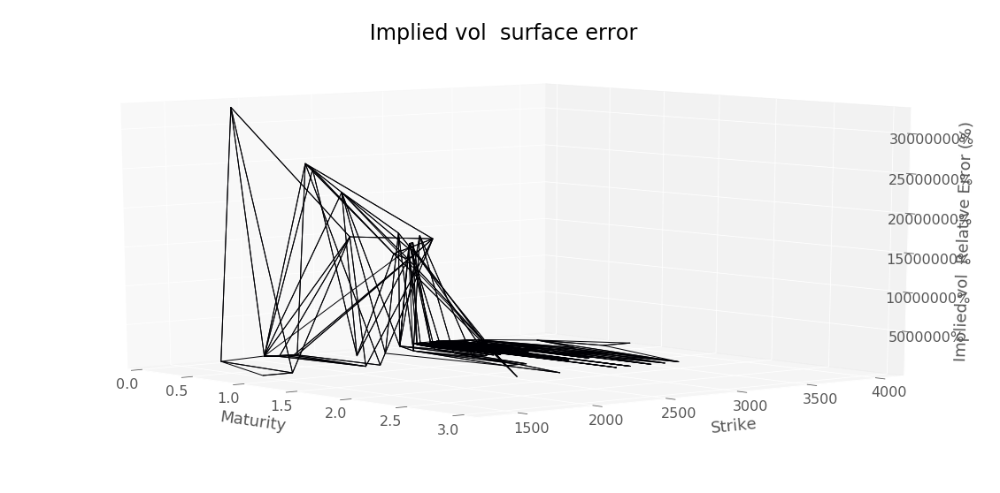

RMSE :  0.14327339179210097


In [77]:
plotTools.predictionDiagnosis(serie, 
                              dataSetTest["ImpliedVol"], 
                              " Implied vol ",
                              yMin=KMin, 
                              yMax=KMax)

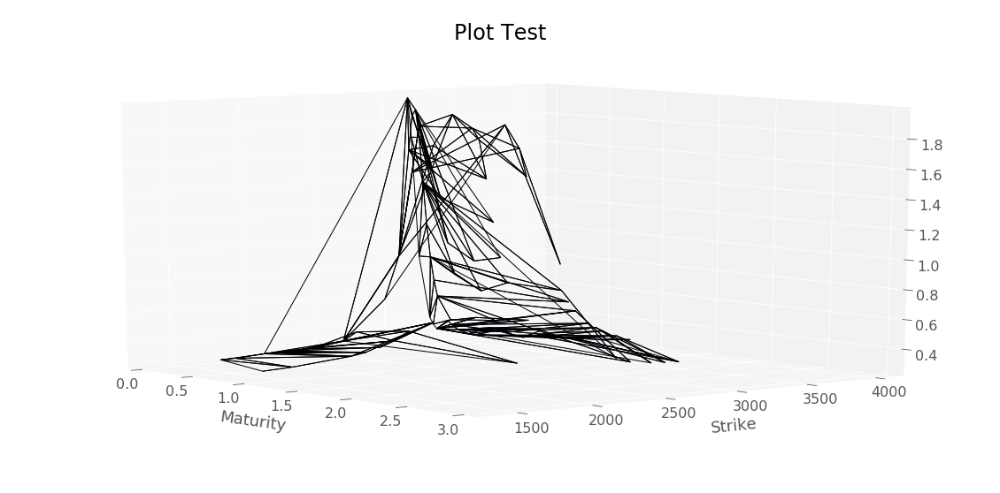

In [78]:
plotTools.plotSerie(density,
                    Title = 'Plot Test',
                    az=320,
                    yMin=0,
                    yMax=10000)

/home/chataigner/anaconda3/lib/python3.7/site-packages/matplotlib/colors.py:512: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


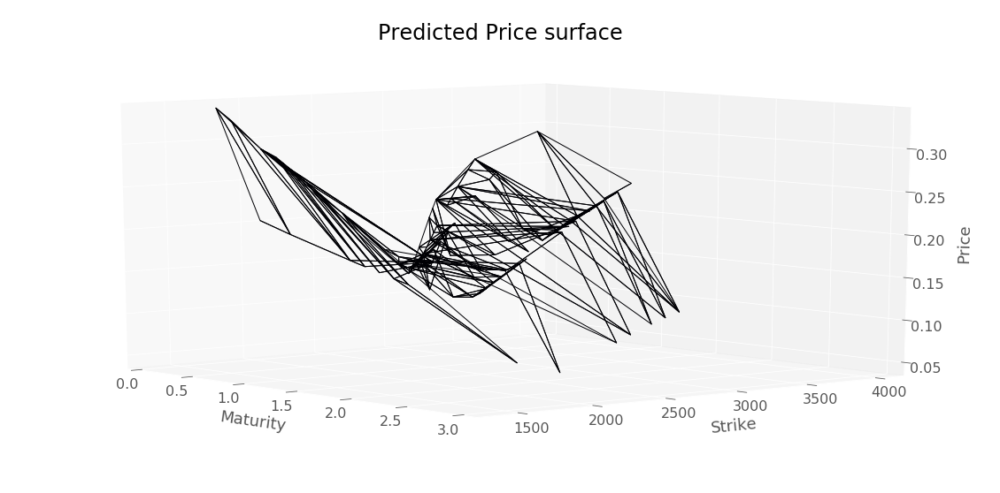

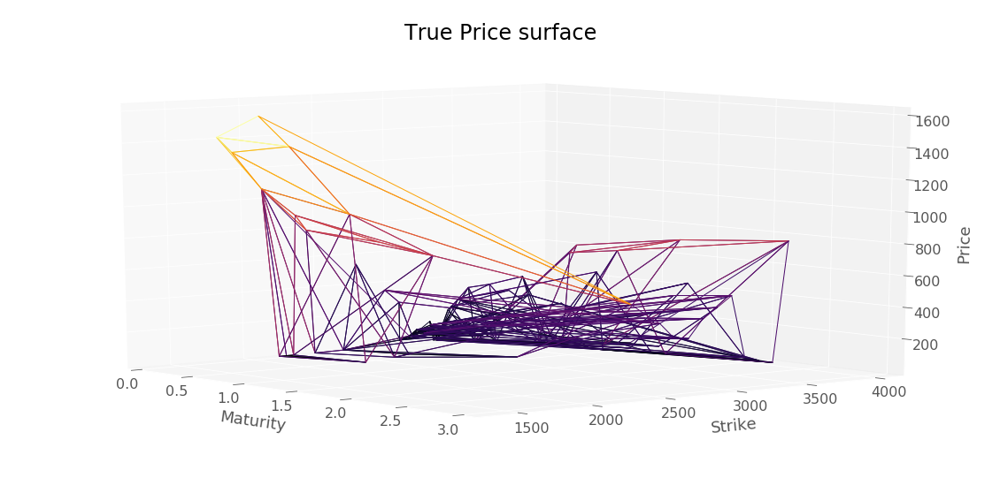

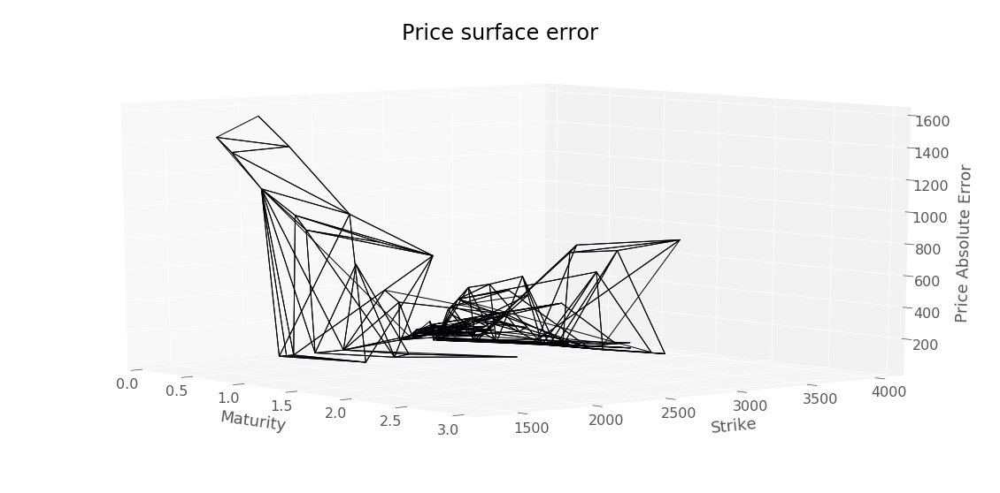

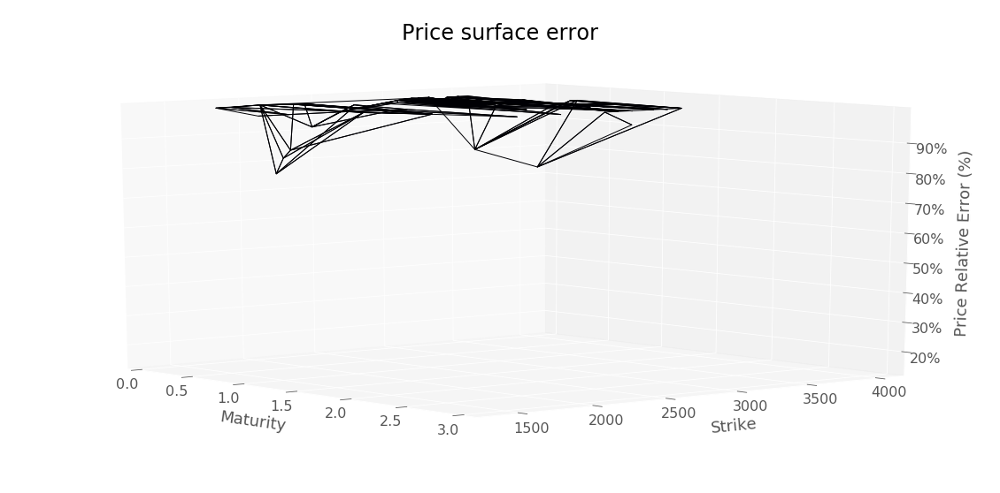

RMSE :  410.18263792573885


/home/chataigner/anaconda3/lib/python3.7/site-packages/matplotlib/colors.py:512: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


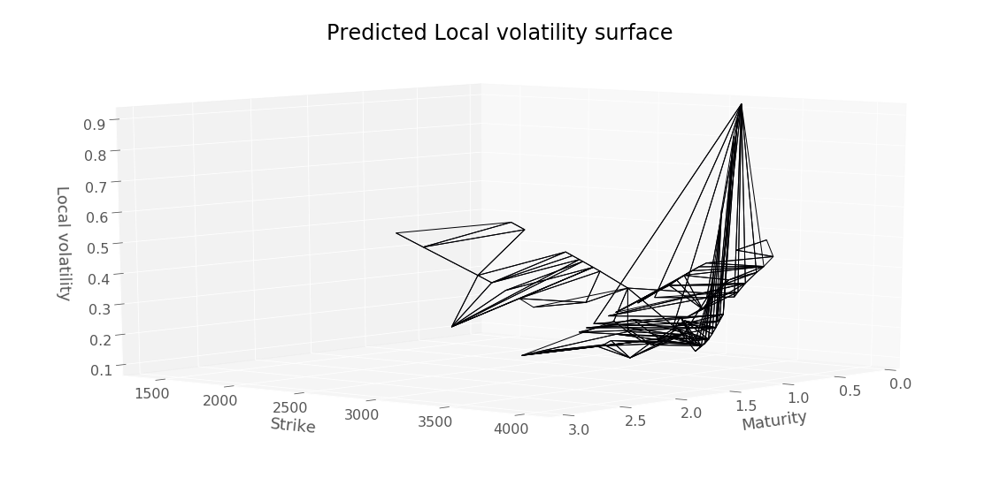

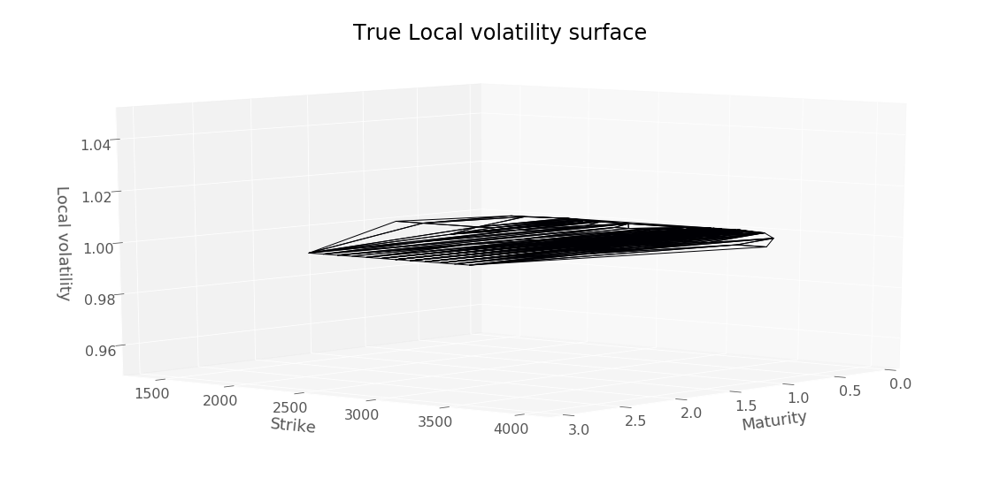

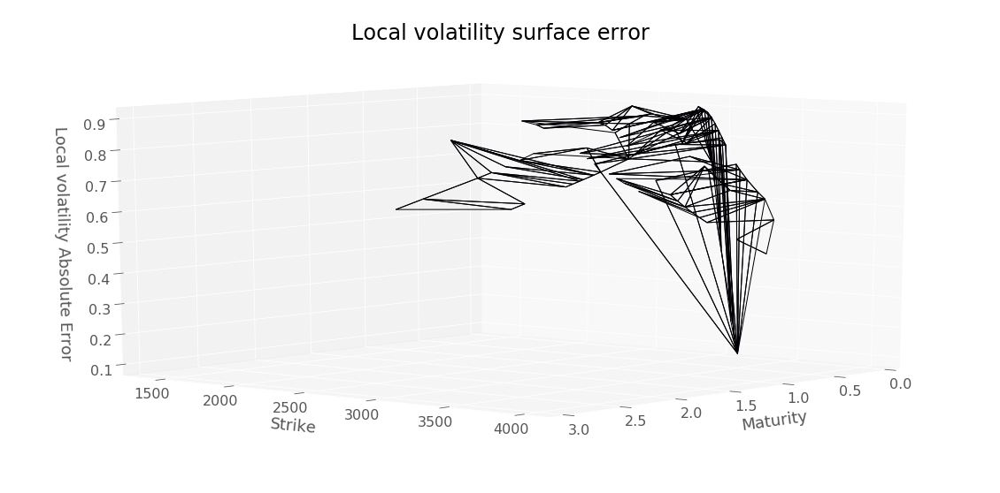

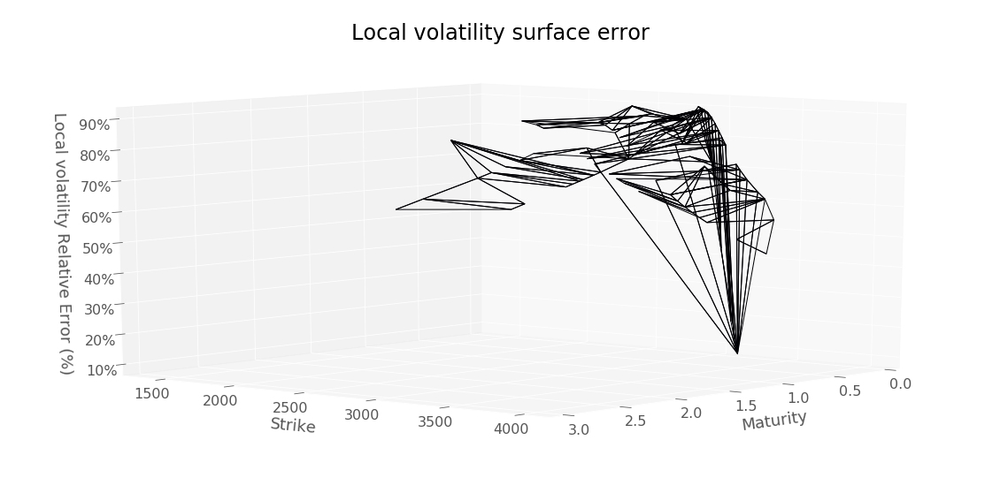

RMSE :  0.7317968572537044


/home/chataigner/anaconda3/lib/python3.7/site-packages/matplotlib/colors.py:512: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


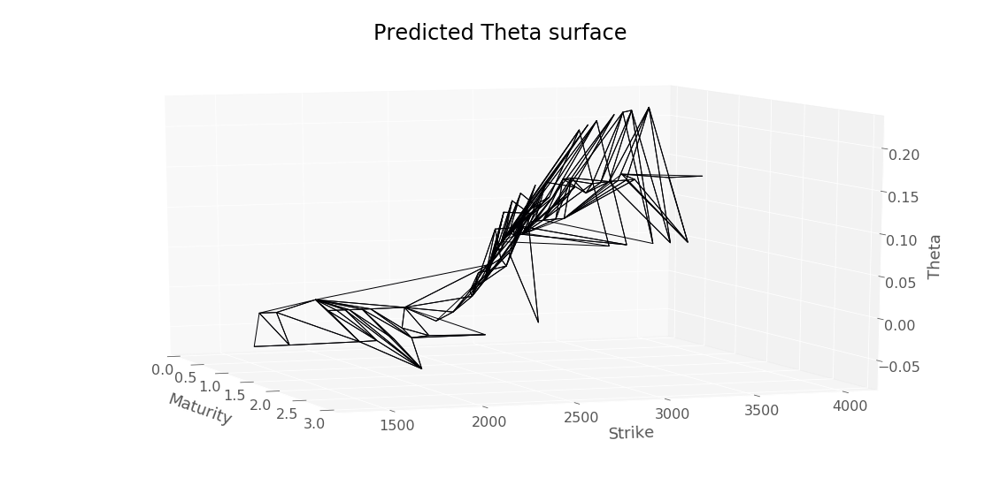

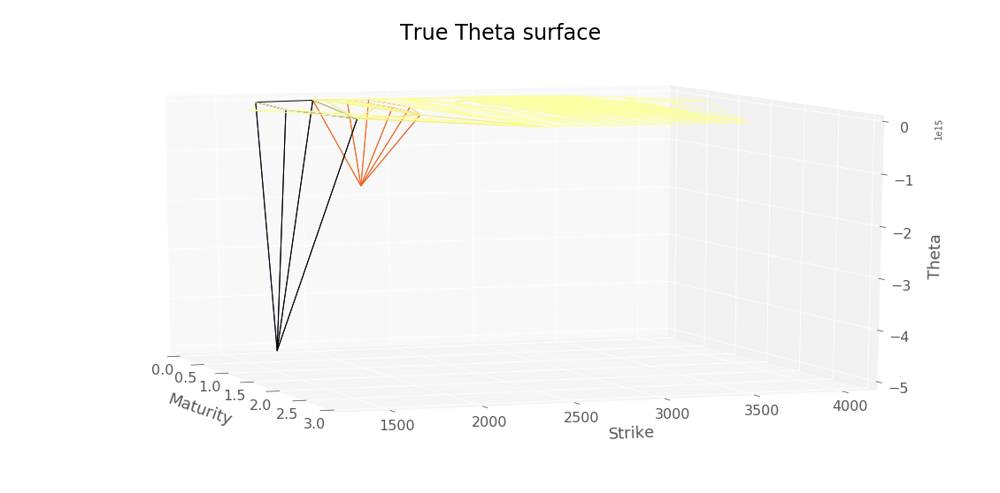

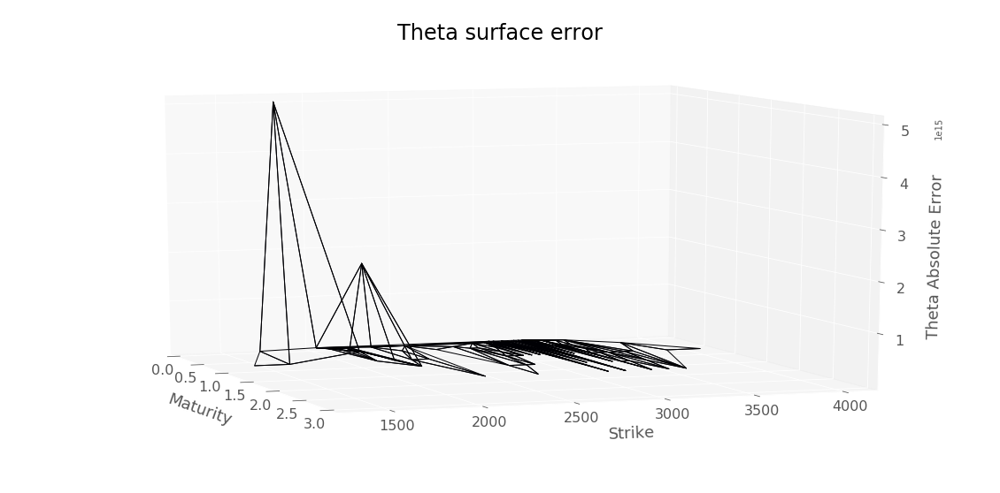

/home/chataigner/anaconda3/lib/python3.7/site-packages/mpl_toolkits/mplot3d/proj3d.py:135: RuntimeWarning: invalid value encountered in true_divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w


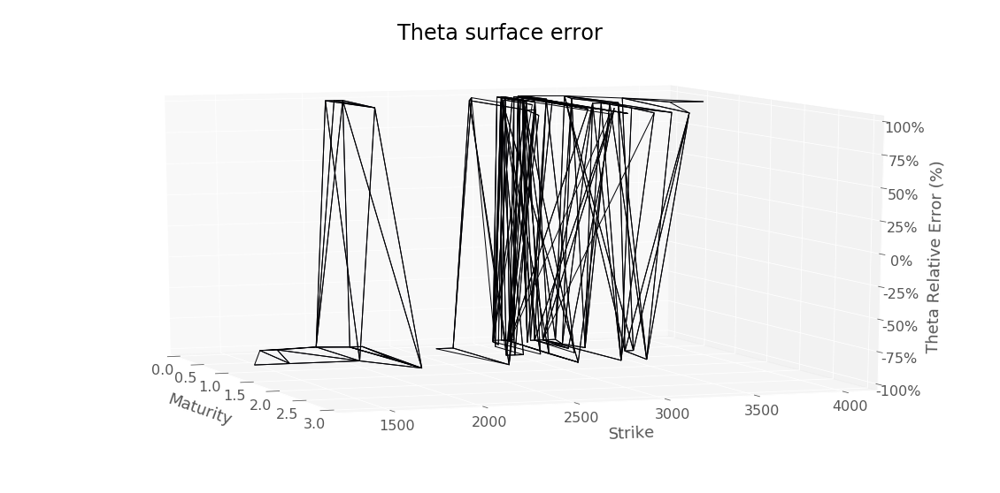

RMSE :  412265645988034.44


/home/chataigner/anaconda3/lib/python3.7/site-packages/matplotlib/colors.py:512: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


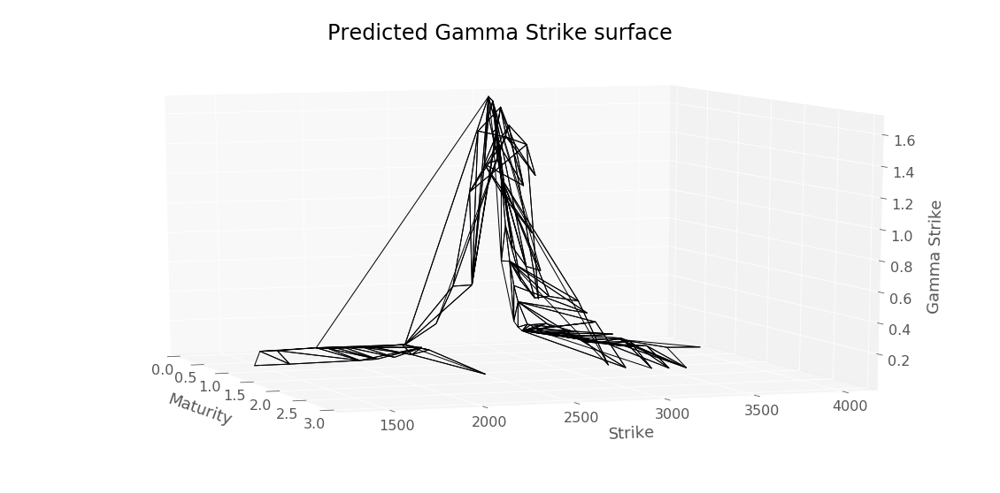

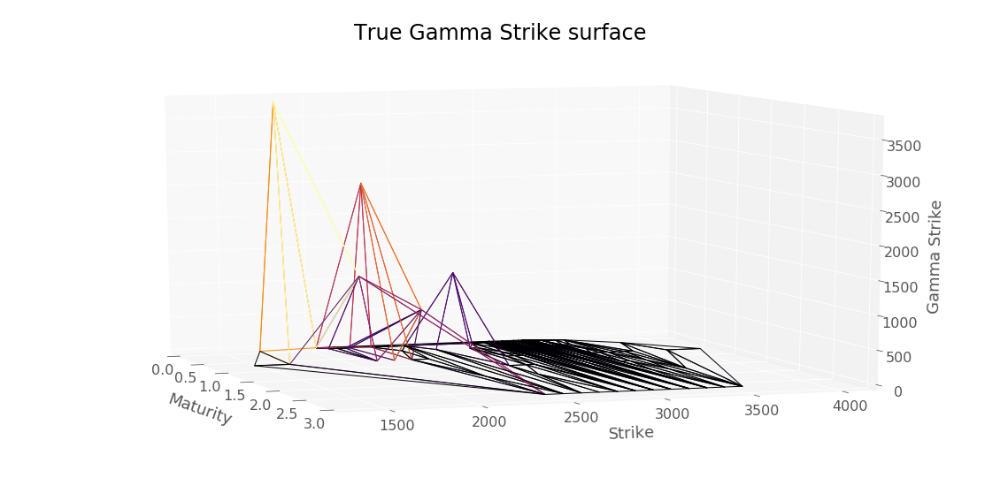

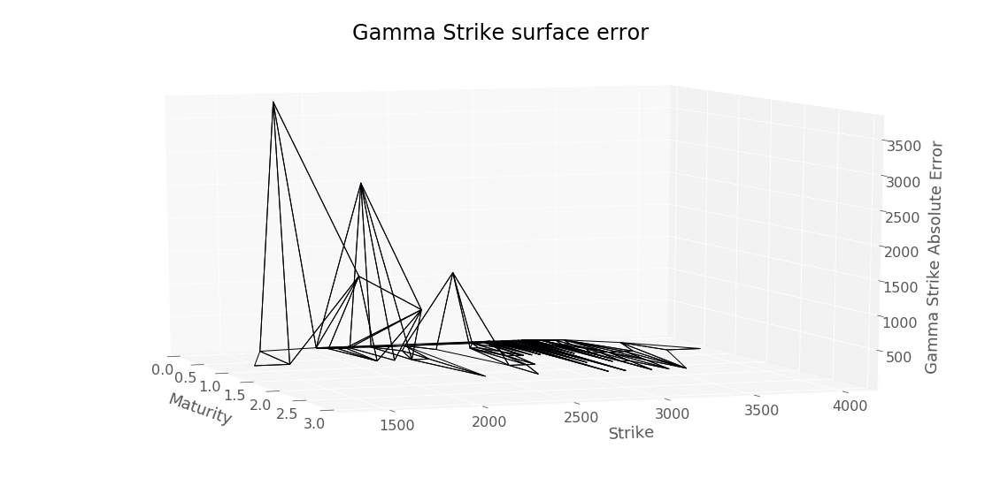

/home/chataigner/anaconda3/lib/python3.7/site-packages/mpl_toolkits/mplot3d/proj3d.py:135: RuntimeWarning: invalid value encountered in true_divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w


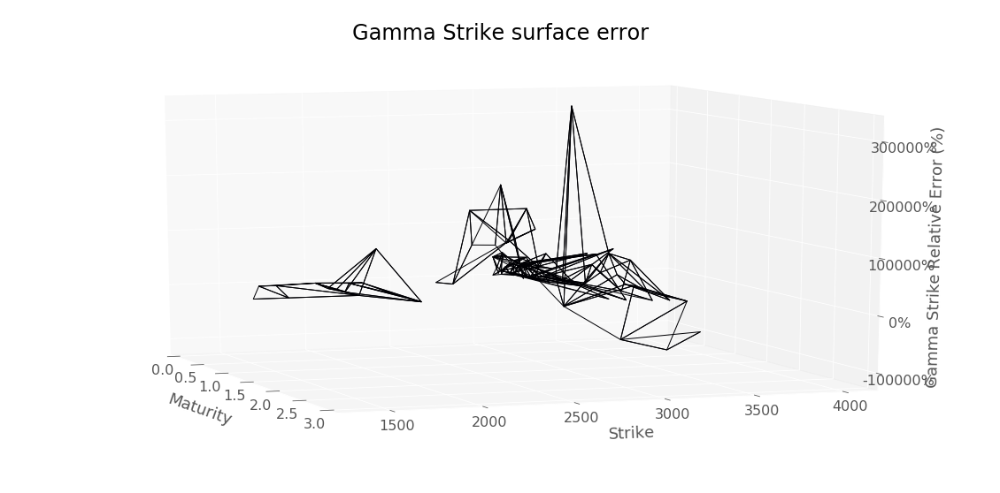

RMSE :  505.544266693506


In [79]:
plotTools.modelSummary(serie, 
                       locVolSSVI, 
                       dK, 
                       hk, 
                       dataSetTest,
                       yMin=KMin, 
                       yMax=KMax)

#### Evaluate local volatility on gp local volatility grid

In [80]:
importlib.reload(loadData)

<module 'loadData' from './code/loadData.py'>

In [83]:
kernel = "Matern" #"Gaussian"
workingFolder = "./data/09082001/"
locVolAreskyFormatted = loadData.loadGPLocVol(workingFolder, kernel, bootstrap, S0)

Loading local volatility from :  ./data/09082001/local_vol_matern_5_2.csv


In [84]:
locVolAreskyFormatted.head()

OptionType  logMoneyness  ChangedStrike    Strike  \
Strike   Maturity                                                      
4171.929 0.20            -1.0      0.308744    4180.785998  4171.929   
         0.24            -1.0      0.311481    4192.245040  4171.929   
         0.28            -1.0      0.315653    4209.771045  4171.929   
         0.32            -1.0      0.322883    4240.319705  4171.929   
         0.36            -1.0      0.329109    4266.800682  4171.929   

                   Maturity         K         T  LocalVolatility  
Strike   Maturity                                                 
4171.929 0.20      0.200000  4171.929  0.200000         0.387651  
         0.24      0.239895  4171.929  0.239895         0.405029  
         0.28      0.279789  4171.929  0.279789         0.421496  
         0.32      0.319684  4171.929  0.319684         0.432692  
         0.36      0.359579  4171.929  0.359579         0.438045

In [85]:
locVolAreskyFormatted.shape

(171, 8)

In [86]:
locVolAreskyFormatted.head()

OptionType  logMoneyness  ChangedStrike    Strike  \
Strike   Maturity                                                      
4171.929 0.20            -1.0      0.308744    4180.785998  4171.929   
         0.24            -1.0      0.311481    4192.245040  4171.929   
         0.28            -1.0      0.315653    4209.771045  4171.929   
         0.32            -1.0      0.322883    4240.319705  4171.929   
         0.36            -1.0      0.329109    4266.800682  4171.929   

                   Maturity         K         T  LocalVolatility  
Strike   Maturity                                                 
4171.929 0.20      0.200000  4171.929  0.200000         0.387651  
         0.24      0.239895  4171.929  0.239895         0.405029  
         0.28      0.279789  4171.929  0.279789         0.421496  
         0.32      0.319684  4171.929  0.319684         0.432692  
         0.36      0.359579  4171.929  0.359579         0.438045

In [87]:
locVolAreskyFormatted.drop_duplicates().shape

(171, 8)

In [88]:
locVolAreskyFormatted.index.unique().shape

(171,)

In [89]:
dT, hk, dK, locVolSSVI, density = SSVI.finiteDifferenceSVI(locVolAreskyFormatted, 
                                                           interpolationBind)

./code/SSVI.py:1019: RuntimeWarning: invalid value encountered in sqrt
  locVolGatheral = np.sqrt(dT / numerator)


/home/chataigner/anaconda3/lib/python3.7/site-packages/matplotlib/colors.py:512: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


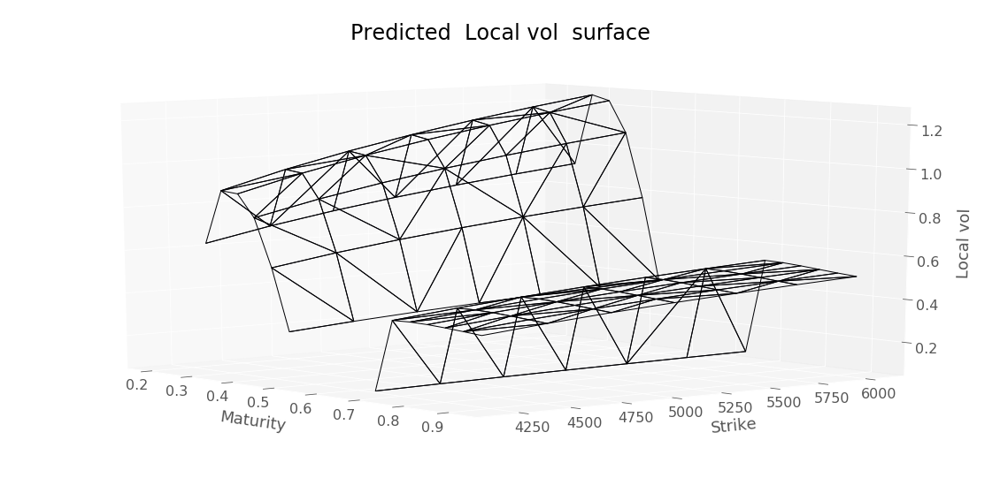

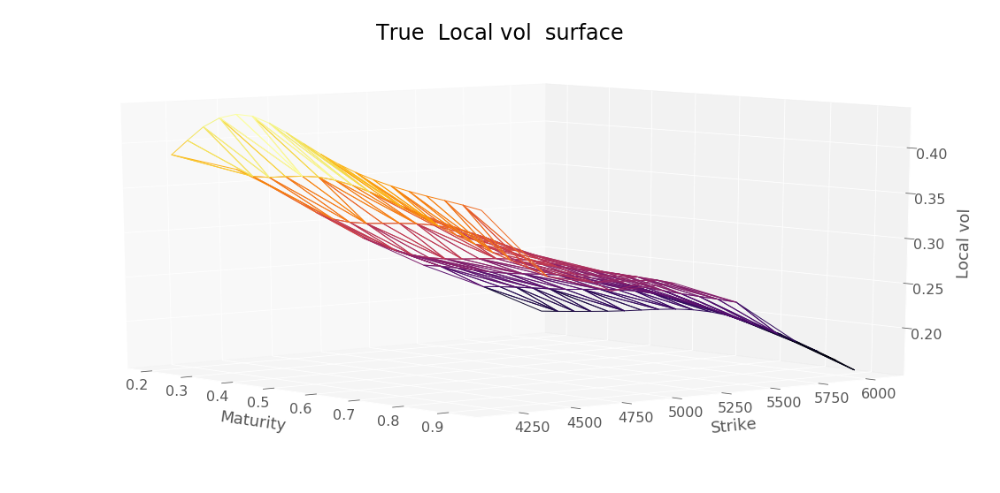

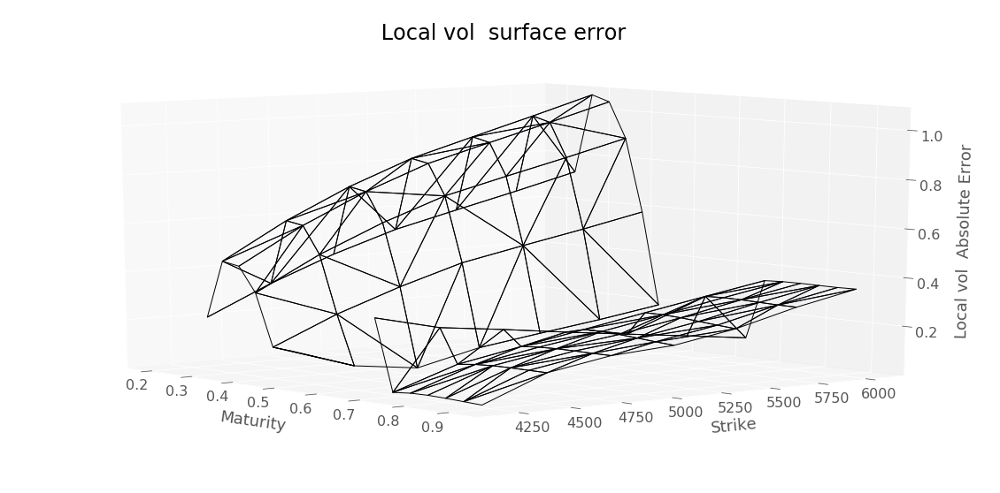

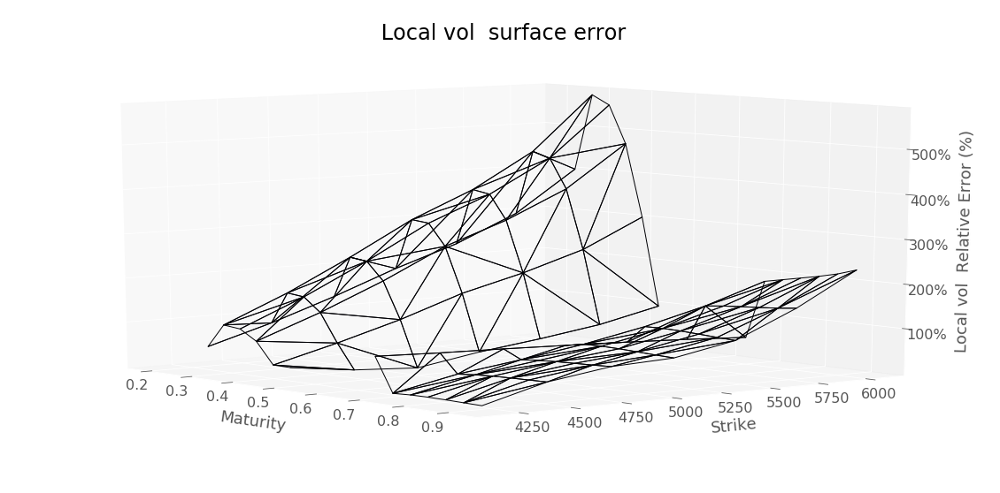

RMSE :  0.501618441984137


In [90]:
plotTools.predictionDiagnosis(locVolSSVI, 
                              locVolAreskyFormatted["LocalVolatility"], 
                              " Local vol ", 
                              yMin=KMin,
                              yMax=KMax)

In [91]:
dataSet["Maturity"].unique()

array([0.942, 0.099, 0.175, 0.444, 1.441, 1.94 , 0.693, 0.268, 0.348])

In [92]:
#Maturity < 2
#K entr 70% et 130% de S0
#50 points pour le training set
#quasi-Aléatoire 

#Prix de call, taux zero coupon, puis parité call put

#Colonne mid, bid, ask, filtrer volume positif 

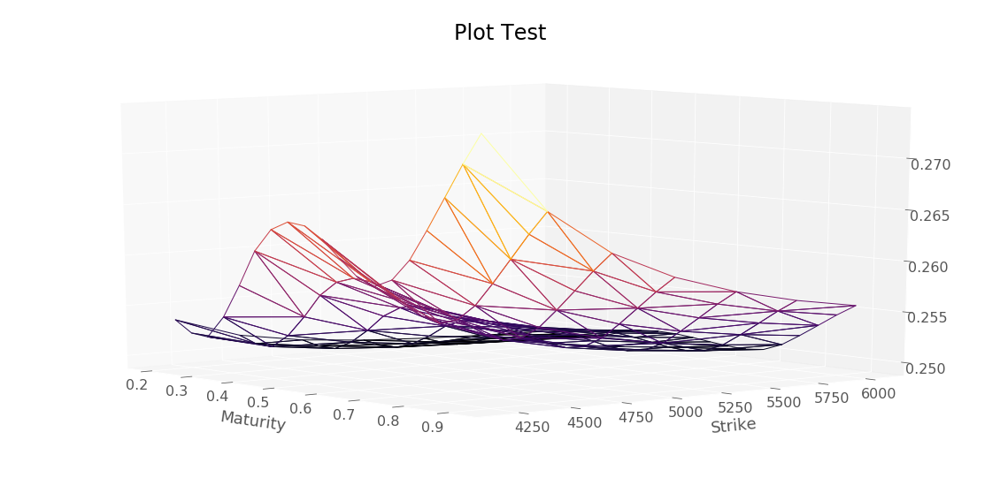

In [93]:
plotTools.plotSerie(density,
                    Title = 'Plot Test',
                    az=320,
                    yMin=KMin,
                    yMax=KMax)

In [94]:
locVolSSVIDf = locVolAreskyFormatted.copy(deep=True)
locVolSSVIDf["LocalVolatility"] = locVolSSVI

In [95]:
locVolSSVIDf.tail()

OptionType  logMoneyness  ChangedStrike    Strike  \
Strike   Maturity                                                      
6678.561 0.759           -1.0      0.811763    6913.792837  6678.561   
         0.798           -1.0      0.812381    6918.066551  6678.561   
         0.838           -1.0      0.812999    6922.343450  6678.561   
         0.878           -1.0      0.813616    6926.621146  6678.561   
         0.918           -1.0      0.814234    6930.899637  6678.561   

                   Maturity         K         T  LocalVolatility  
Strike   Maturity                                                 
6678.561 0.759     0.758526  6678.561  0.758526         0.564079  
         0.798     0.798421  6678.561  0.798421         0.556793  
         0.838     0.838316  6678.561  0.838316         0.547954  
         0.878     0.878211  6678.561  0.878211         0.539370  
         0.918     0.918105  6678.561  0.918105         0.532243

In [96]:
dT[dT<0]

Strike    Maturity
4171.929  0.200      -0.019818
          0.240      -0.086648
          0.519      -0.028668
          0.559      -0.067089
          0.599      -0.084947
          0.639      -0.067843
4485.258  0.200      -0.023490
          0.240      -0.102939
          0.519      -0.032877
          0.559      -0.077062
          0.599      -0.097786
          0.639      -0.078270
4798.587  0.200      -0.026923
          0.240      -0.118163
          0.519      -0.036825
          0.559      -0.086413
          0.599      -0.109819
          0.639      -0.088037
5111.916  0.200      -0.030144
          0.240      -0.132442
          0.519      -0.040537
          0.559      -0.095203
          0.599      -0.121125
          0.639      -0.097211
5425.245  0.200      -0.033176
          0.240      -0.145881
          0.519      -0.044037
          0.559      -0.103487
          0.599      -0.131780
          0.639      -0.105856
5738.574  0.200      -0.036040
          0.240     

In [97]:
interpolationBind(locVolAreskyFormatted)

Strike    Maturity
4171.929  0.200       0.372613
          0.240       0.324318
          0.280       0.301554
          0.320       0.320128
          0.360       0.340889
          0.399       0.352709
          0.439       0.354819
          0.479       0.346296
          0.519       0.332444
          0.559       0.315037
          0.599       0.295868
          0.639       0.277798
          0.679       0.265485
          0.719       0.261745
          0.759       0.259212
          0.798       0.256958
          0.838       0.254878
          0.878       0.252907
          0.918       0.251012
4485.258  0.200       0.409527
          0.240       0.356535
          0.280       0.331183
          0.320       0.350263
          0.360       0.371627
          0.399       0.383517
          0.439       0.385089
          0.479       0.375614
          0.519       0.360572
          0.559       0.341808
          0.599       0.321201
                        ...   
6365.232  0.519     

ValueError: x and y must have same first dimension, but have shapes (0,) and (9,)

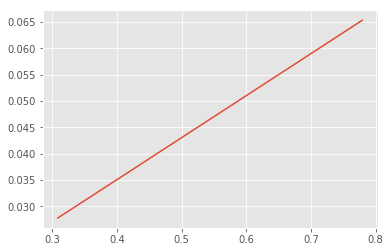

In [98]:
plotTools.plotEachSmilePred(locVolAreskyFormatted, 
                            interpolationBind)
plt.show()

# MC backtest 

#### PDE Backtest

Implement Crank-Nicolson scheme for black-scholes PDE in python within *priceEuropeanCallCranckNicholson* function.

It should return the price and the delta.


We want to solve Black-Scholes PDE with log return $x=\log{S}$ that is we want to find $u$ which solves :
$$u(T,x) = \left( e^x - K \right)^+, x \in \mathbb{R}$$
$$\partial_t u + (b - \frac{\sigma^2}{2}) \partial_x u + \frac{1}{2} \sigma^2 \partial_x^2 u  - b u = 0 \textbf{ in }  [0,T) \times (-\infty,\infty)$$

Finite difference methods amounts to bound the domain $\mathcal{O} = [0,T) \times (-\infty,\infty)$ with a bounded one $[0,T) \times (x^-,x^+)$. 
We use dirichlet condition which in the case of european call gives $u(t, x^-) = 0$ and $u(t, x^+) =e^{-b (T-t)} (e^{x^+} - K)$ .

Then we discretize along time axis and space axis and approximate derivatives of $u$ with discrete variations.
Thus we can show for a given time step $h$ and log space step $k$ that we must solve the following linear algebra problem :

$$ \left[ I - h \theta A^k \right] u_{i} = \left[ I - h (1-\theta) A^k \right] u_{i+1} + h \left( \theta w^k(t_i) + (1-\theta) w^k(t_{i+1}) \right)$$
with $u_n^j = \left( e^{\log{S_0} + j k} - K \right)^+ , \forall j \in \mathcal{K}$ a discrete log space discretization.

$A$ is a tridiagonal matrix with $\alpha = \frac{\sigma^2}{2 k^2} - \frac{b}{2k}$ on the lower diagonal, $\gamma = \frac{\sigma^2}{2 k^2} + \frac{b}{2k}$ on the upper diagonal and $\beta = -\left( \frac{\sigma^2}{k^2} + b \right)$ on the main diagonal.
$w_{t_i}$ is a zero vector except the first (upper) element equal $0$ and the last element is equal to $ \gamma e^{-b h (n-i)} (e^{x^+} - K) $.

In the code we note $M^k = \left[ I - h \theta A^k \right]$ and $N^k = \left[ I - h (1-\theta) A^k \right]$.

Cranck Nicholson corresponds to a theta scheme with $\theta=0.5$.
When $\theta=1$ we have the so-call implicit scheme and for $\theta=1$ the explicit scheme.

Cranck-nicholson scheme has the advantage consistent of order two in time and in space.
For $\theta \neq 1/2$ we have only consistency of order one in time and two in space

In constrast with tree, space discretization is the same for each time step.

$$\partial_t u + \left((r_t-q_t) - \frac{\sigma^2 (x,t)}{2} \right) \partial_x u  + \frac{1}{2} \sigma^2 (x,t) \partial_x^2 u  - q_t u = 0 \textbf{ in }  [0,T) \times (-\infty,\infty)$$

CFL condition :
$$ h \leq \frac{k^2}{\sigma_{sup}^2 + b_{sup} k^2}$$

Here we choose $k$ as $$2 * \sqrt{\frac{\sigma_{sup}^2 h}{ 1 - b_{sup} h}} $$

where $\sigma_{sup} = \sup\limits_{(x,t) \in \hat{\Theta}}{\sigma_{loc}(e^x,t)}$ and $b_{sup} = \sup\limits_{t \in [0,T]}{(r-q)(t)}$




In [102]:
nbTimeStep = 10#100
nbPaths = 100#100000


In [103]:
importlib.reload(backtest)

<module 'backtest' from '/home/chataigner/Téléchargements/LOCVOL/backtest.py'>

#### GP Local Volatility

In [104]:
testingDataSetAresky = dataSetConstruction.interpolatedLocalVolatility(locVolAreskyFormatted, 
                                                                       testingDataSet["Price"])

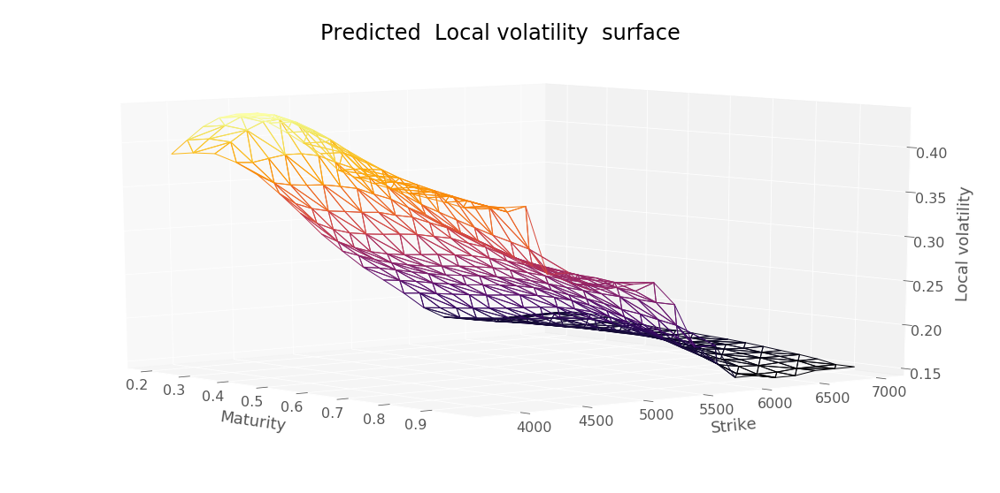

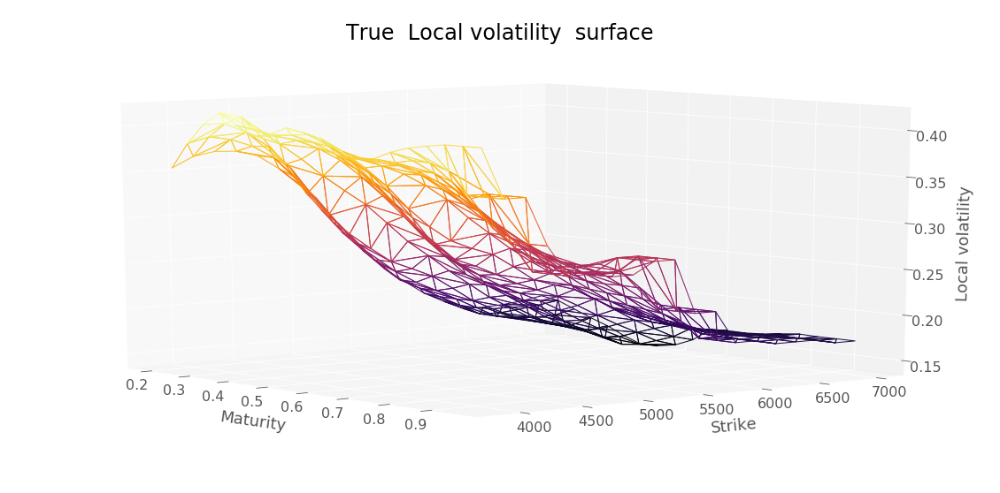

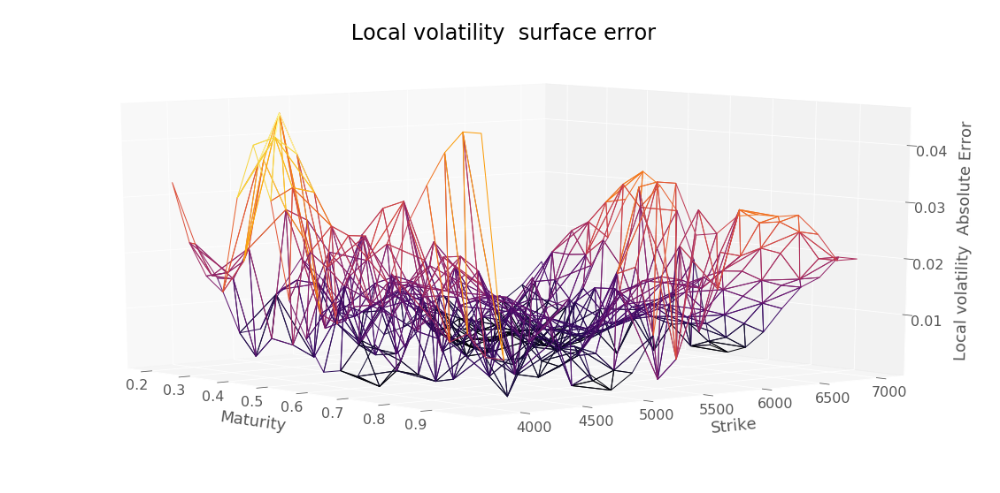

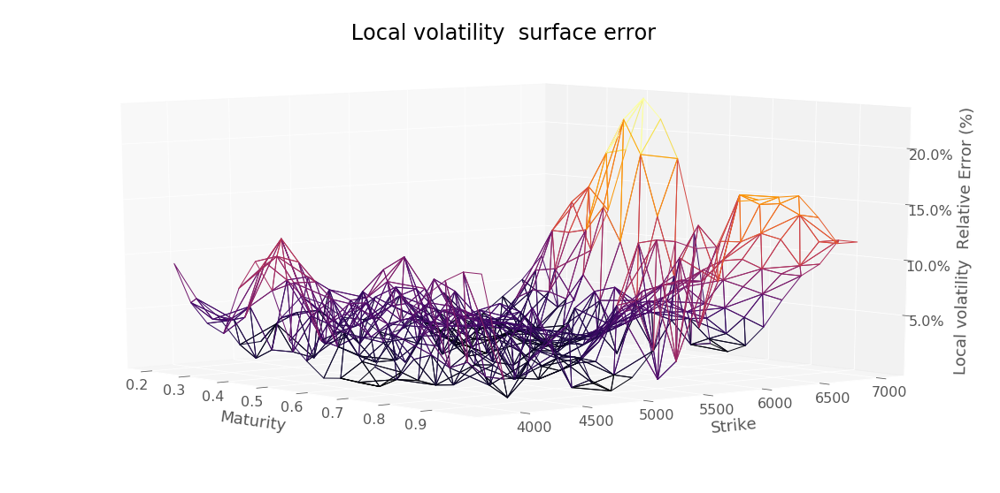

RMSE :  0.01568875310470875


In [105]:
plotTools.predictionDiagnosis(testingDataSetAresky, 
                              dataSetTest["locvol"], 
                              " Local volatility ",
                              yMin=KMin,
                              yMax=KMax)

In [106]:
nnAresky = lambda x,y : backtest.interpolatedMCLocalVolatility(locVolAreskyFormatted["LocalVolatility"], 
                                                               x, 
                                                               y)

In [107]:
mcResSigmaAreskyTest = backtest.MonteCarloPricerVectorized(S0,
                                                           dataSetTest,
                                                           bootstrap,
                                                           nbPaths,
                                                           nbTimeStep,
                                                           nnAresky)
mcResSigmaAreskyTest.head()

Strike  Maturity
3858.6  0.200        0.000000
        0.242        0.000000
        0.284       17.262971
        0.326        7.977089
        0.368        2.389942
dtype: float64

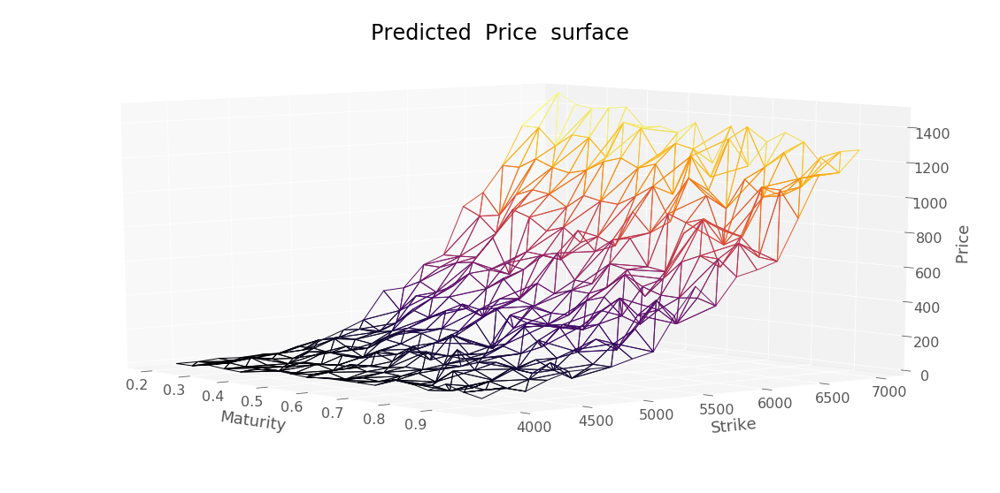

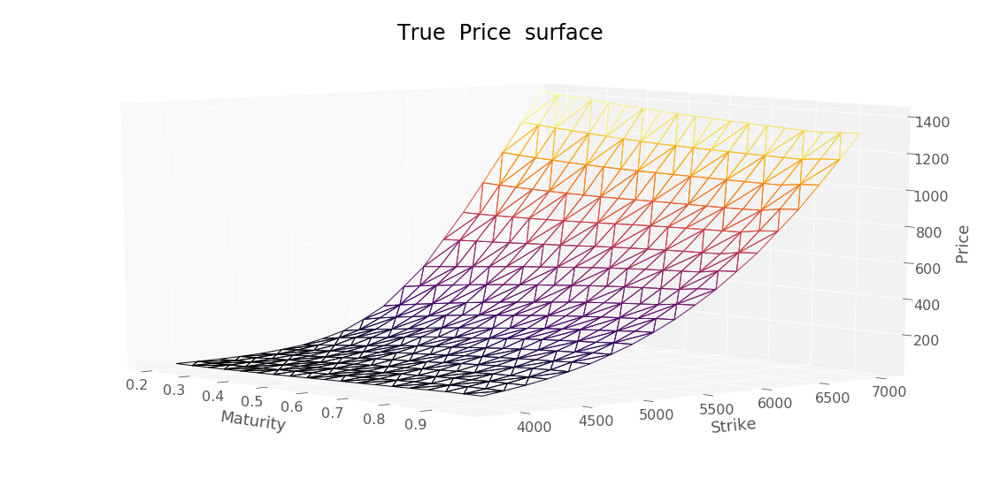

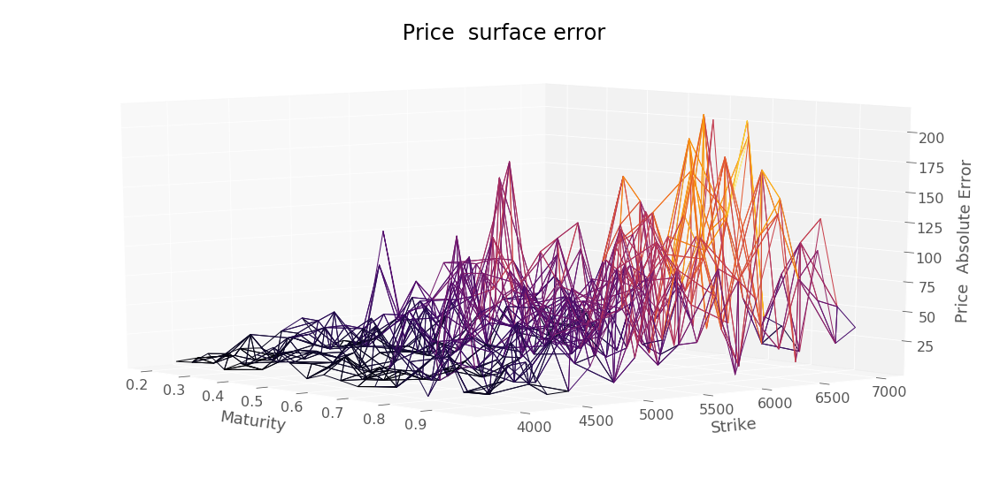

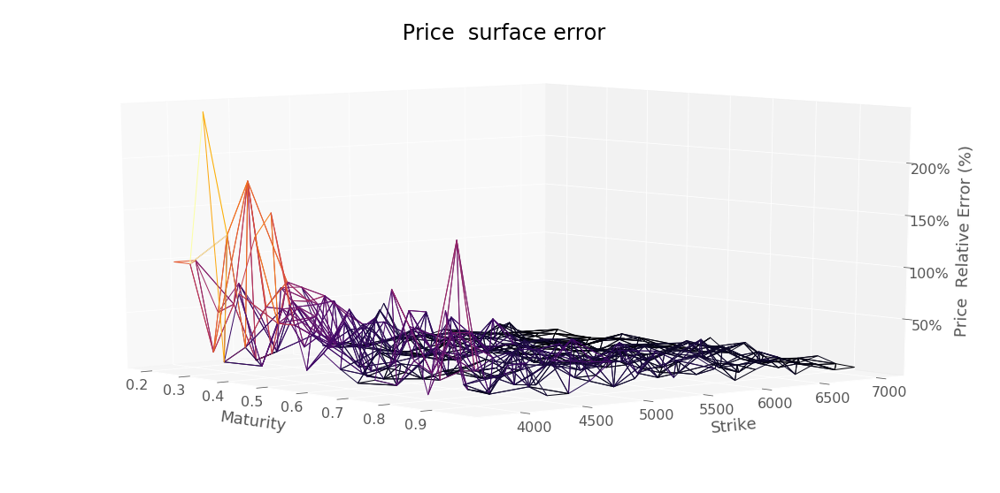

RMSE :  59.52967342339557


In [108]:
plotTools.predictionDiagnosis(mcResSigmaAreskyTest, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [109]:
mcResSigmaAreskyTest.to_csv(workingFolder + "mcResSigmaAreskyTest.csv")

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


In [110]:
mcResSigmaAreskyTrain = backtest.MonteCarloPricerVectorized(S0,
                                                            dataSet,
                                                            bootstrap,
                                                            nbPaths,
                                                            nbTimeStep,
                                                            nnAresky)
mcResSigmaAreskyTrain.head()

Strike  Maturity
3600    0.118        0.000000
        0.367        0.000000
        0.597       13.893588
        0.866        8.633896
3800    0.118        0.000000
dtype: float64

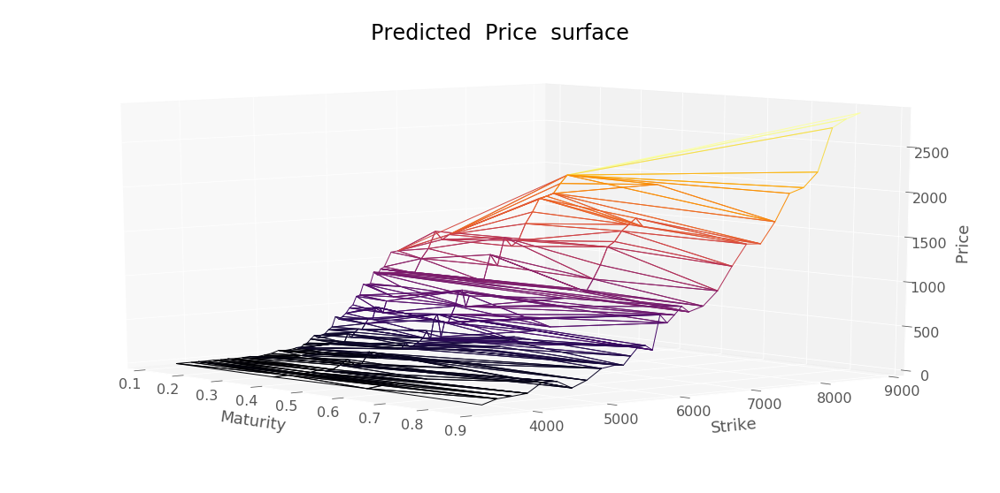

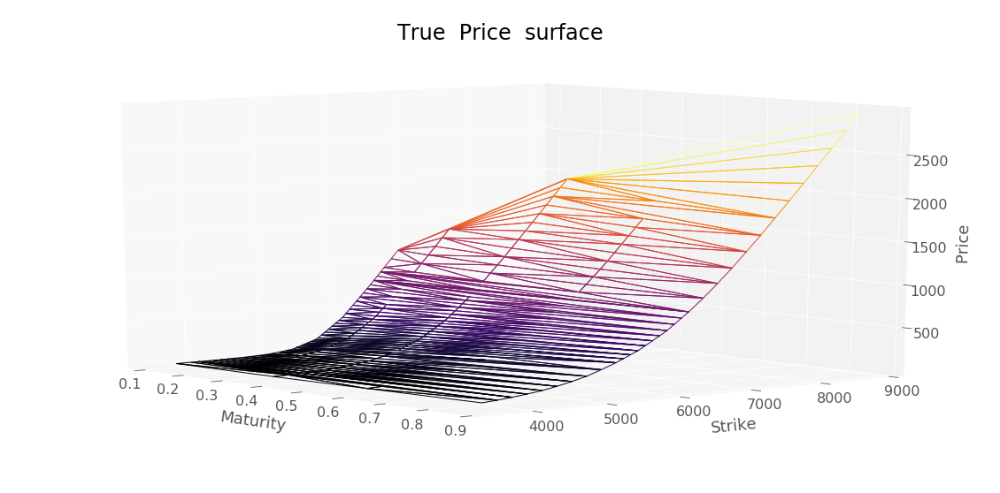

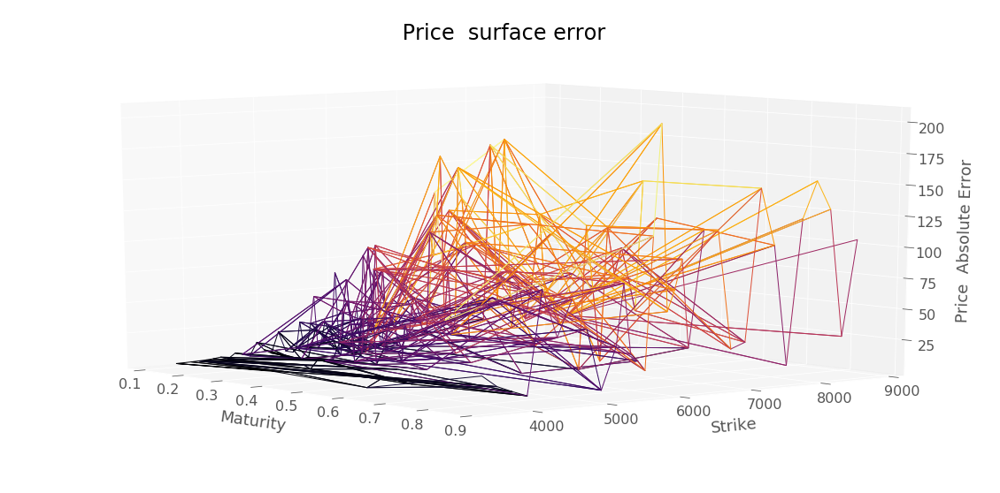

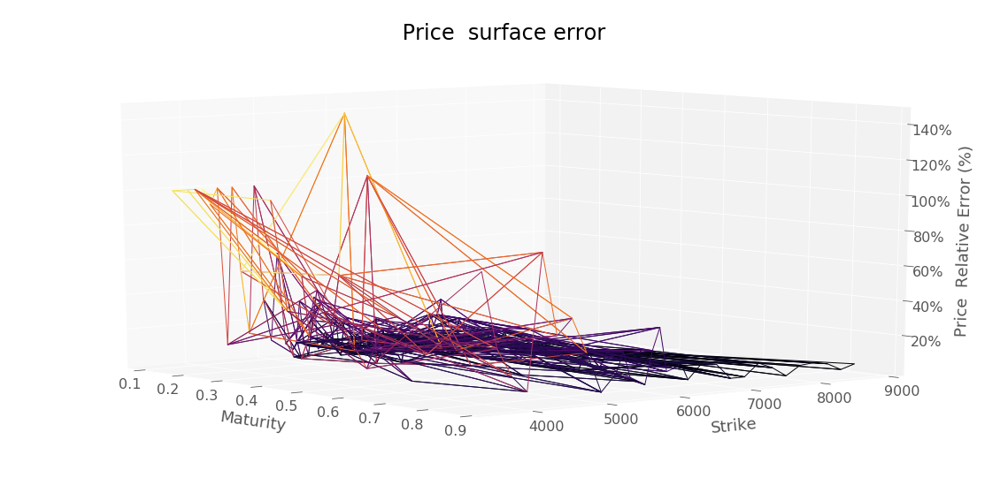

RMSE :  63.03983181447788


In [111]:
plotTools.predictionDiagnosis(mcResSigmaAreskyTrain, 
                              dataSet["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [112]:
mcResSigmaAreskyTrain.to_csv(workingFolder + "mcResSigmaAreskyTrain.csv")

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


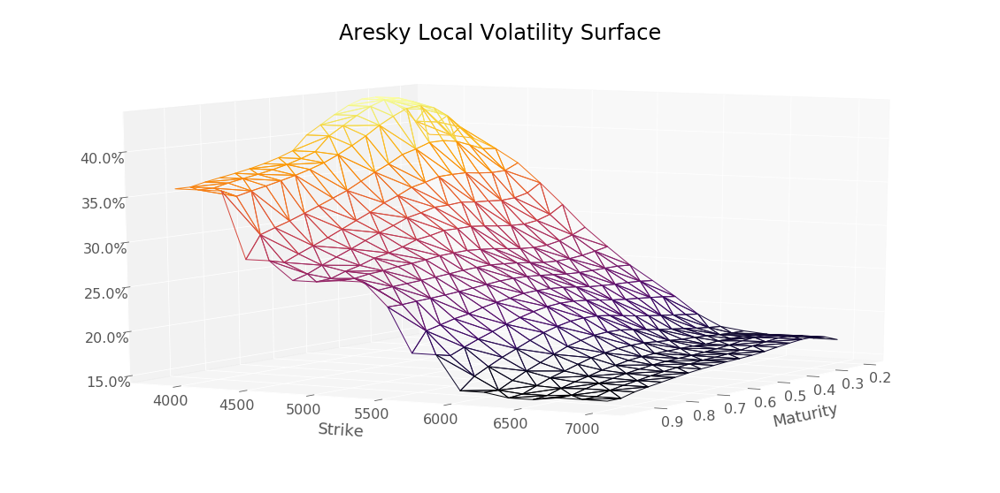

In [113]:
plotTools.plotSerie(testingDataSetAresky[testingDataSetAresky.index.get_level_values("Maturity") > 0.01],
                    Title = 'Aresky Local Volatility Surface',
                    az=30,
                    yMin=0.0*S0,
                    yMax=2.0*S0, 
                    zAsPercent=True)

In [114]:
pdeResSigmaAreskyTrain = backtest.PDEPricerVectorized(dataSet, S0, nnAresky, bootstrap)
pdeResSigmaAreskyTrain.head()

Strike  Maturity
3600    0.118        0.024807
        0.367        5.285168
        0.597       18.263646
        0.866       33.739158
3800    0.118        0.092928
dtype: float64

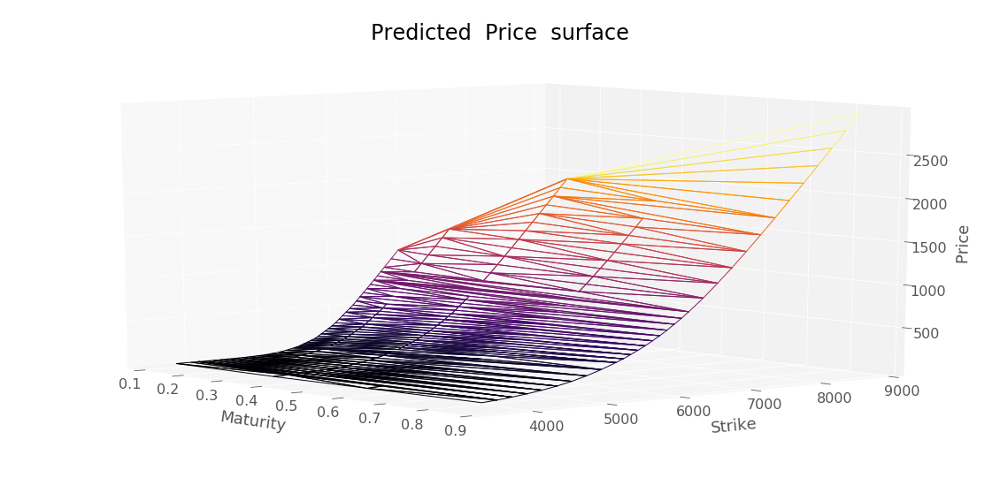

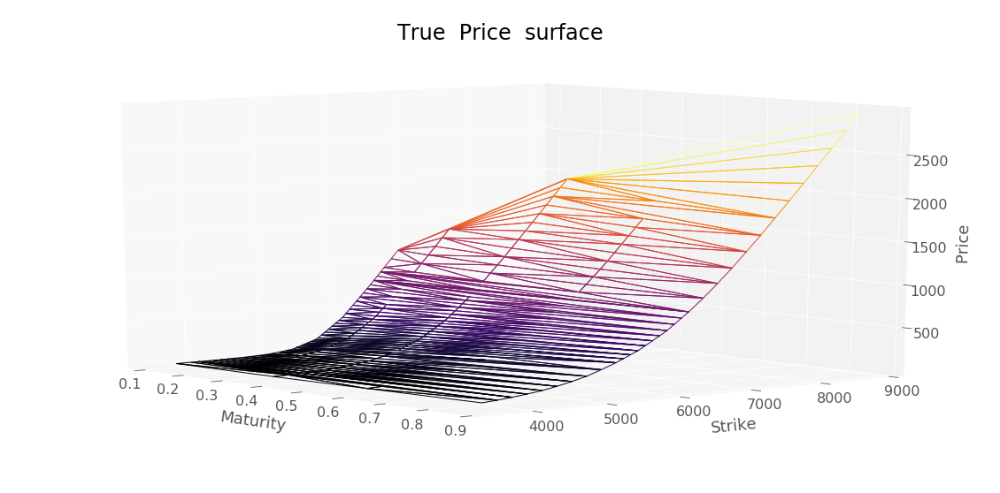

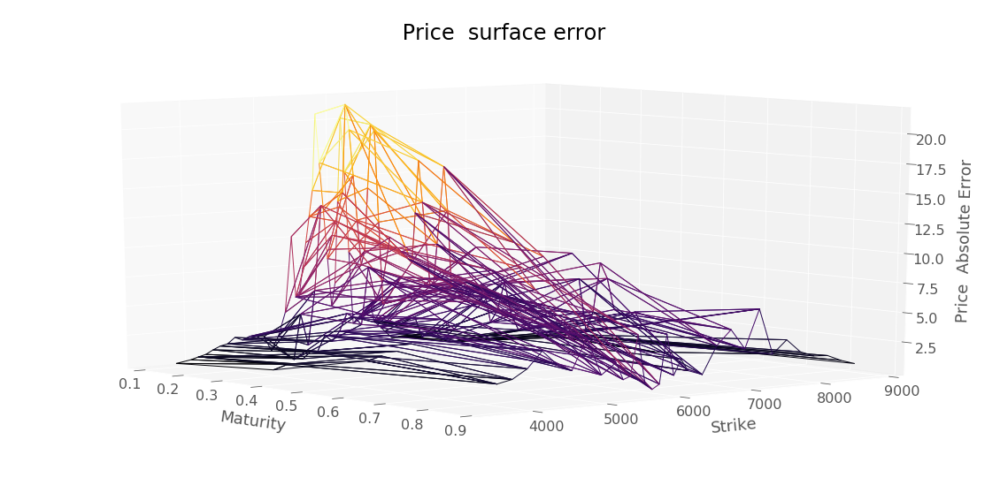

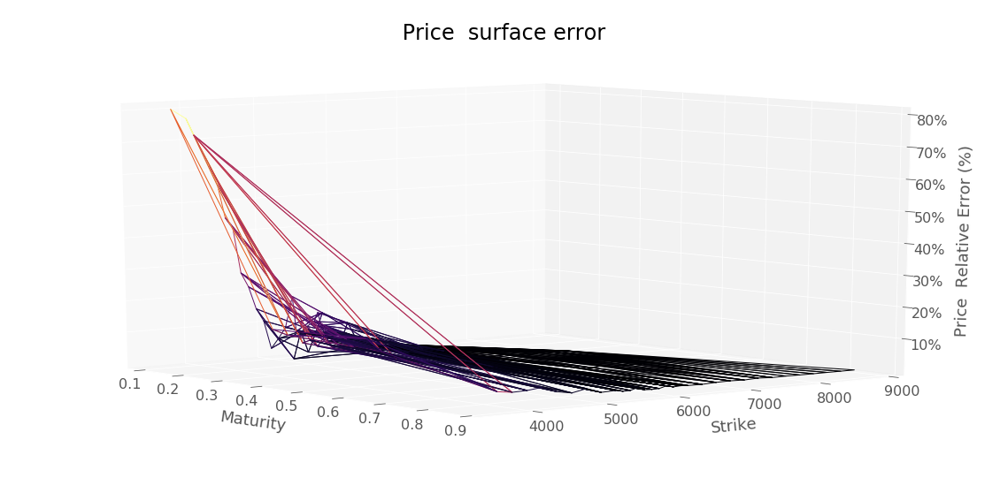

RMSE :  7.527944334447842


In [115]:
plotTools.predictionDiagnosis(pdeResSigmaAreskyTrain, 
                              dataSet["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [116]:
pdeResSigmaAreskyTrain.to_csv(workingFolder + "pdeResSigmaAreskyTrain.csv")

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


In [119]:
pdeResSigmaAreskyTest = backtest.PDEPricerVectorized(dataSetTest, S0, nnAresky, bootstrap)
pdeResSigmaAreskyTest.head()

Strike  Maturity
3858.6  0.200        1.497233
        0.242        2.986239
        0.284        5.150804
        0.326        7.915650
        0.368       11.124222
dtype: float64

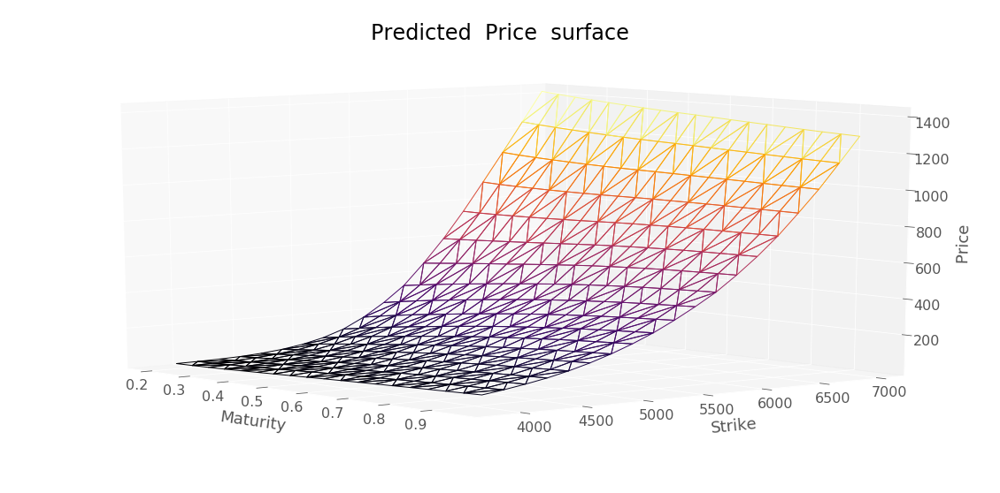

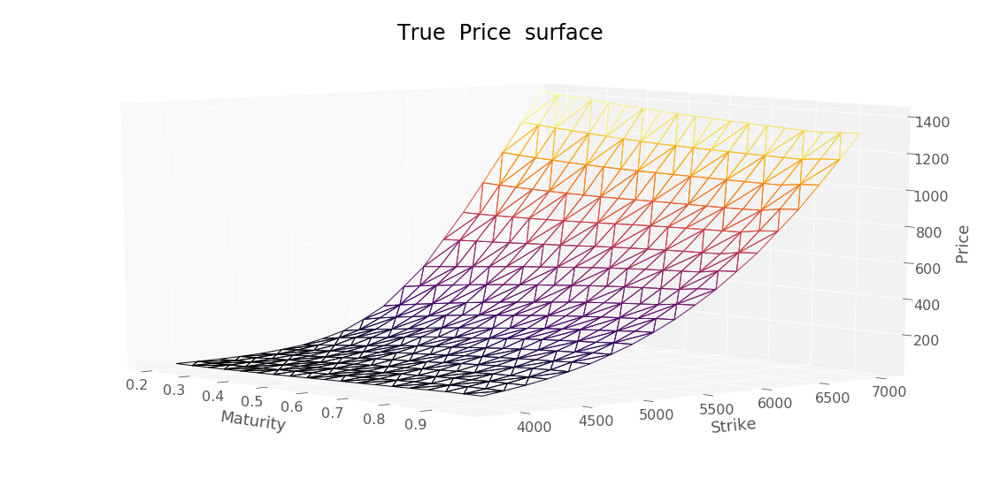

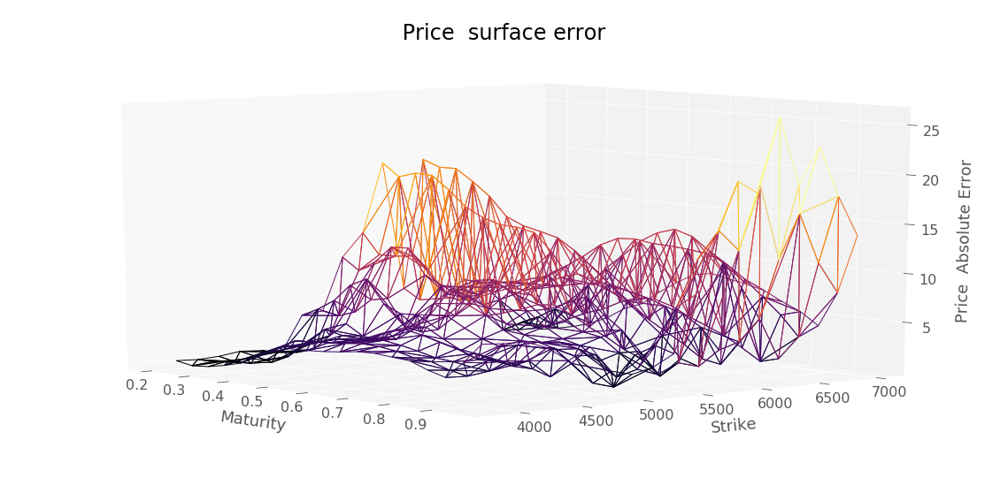

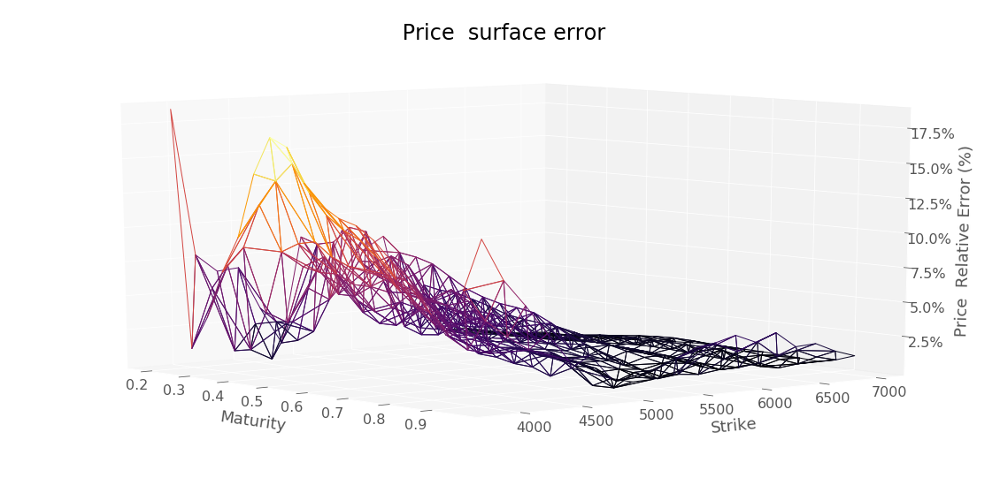

RMSE :  7.493935853415093


In [120]:
plotTools.predictionDiagnosis(pdeResSigmaAreskyTest, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [121]:
pdeResSigmaAreskyTest.to_csv(workingFolder + "pdeResSigmaAreskyTest.csv")

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


#### Tikhonov calibration

In [122]:
nnVolLocaleTykhonov = lambda x,y : backtest.interpolatedMCLocalVolatility(localVolatility["LocalVolatility"], x, y)


In [123]:
s = testingDataSetAresky.index.get_level_values("Strike").values
t = testingDataSetAresky.index.get_level_values("Maturity").values

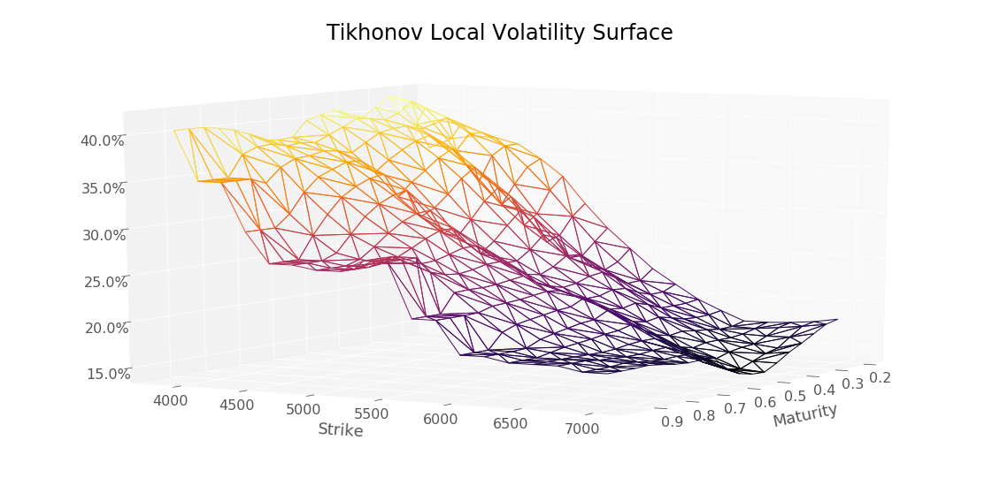

In [124]:
tikhonovLocVol = nnVolLocaleTykhonov(s, t)
plotTools.plotSerie(tikhonovLocVol[tikhonovLocVol.index.get_level_values("Maturity") > 0.01],
                    Title = 'Tikhonov Local Volatility Surface',
                    az=30,
                    yMin=0.0*S0,
                    yMax=2.0*S0, 
                    zAsPercent=True)

In [125]:
mcResTikhonovTest = backtest.MonteCarloPricerVectorized(S0,
                                                        dataSetTest,
                                                        bootstrap,
                                                        nbPaths,
                                                        nbTimeStep,
                                                        nnVolLocaleTykhonov)
mcResTikhonovTest.head()

Strike  Maturity
3858.6  0.200        0.568095
        0.242        8.990208
        0.284       10.218066
        0.326        9.116409
        0.368       15.431192
dtype: float64

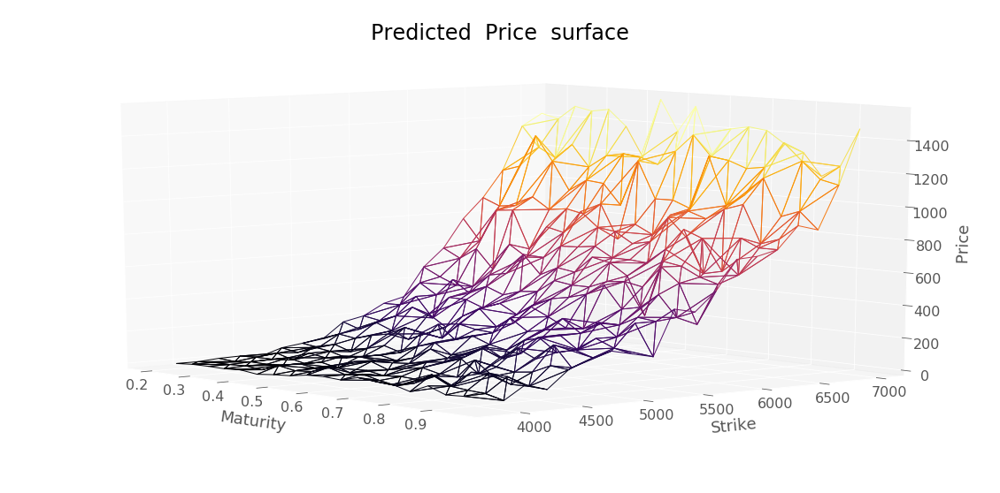

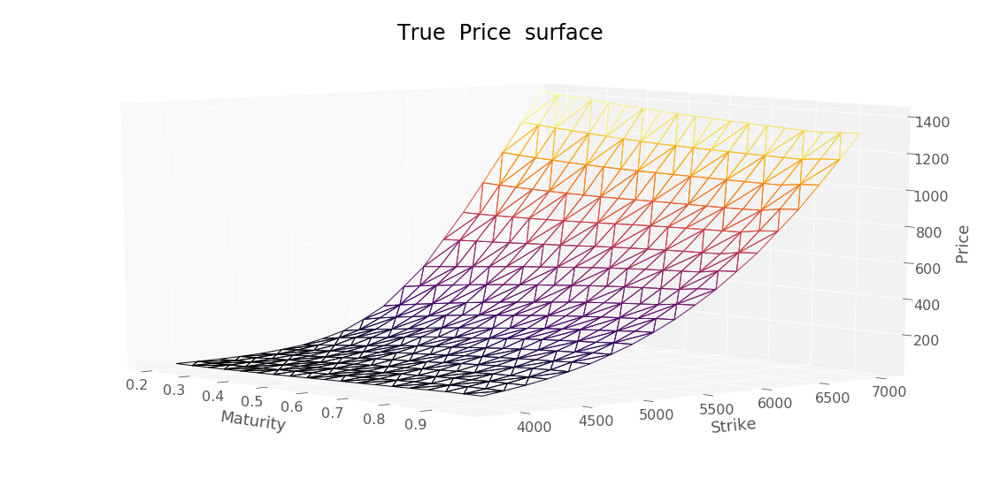

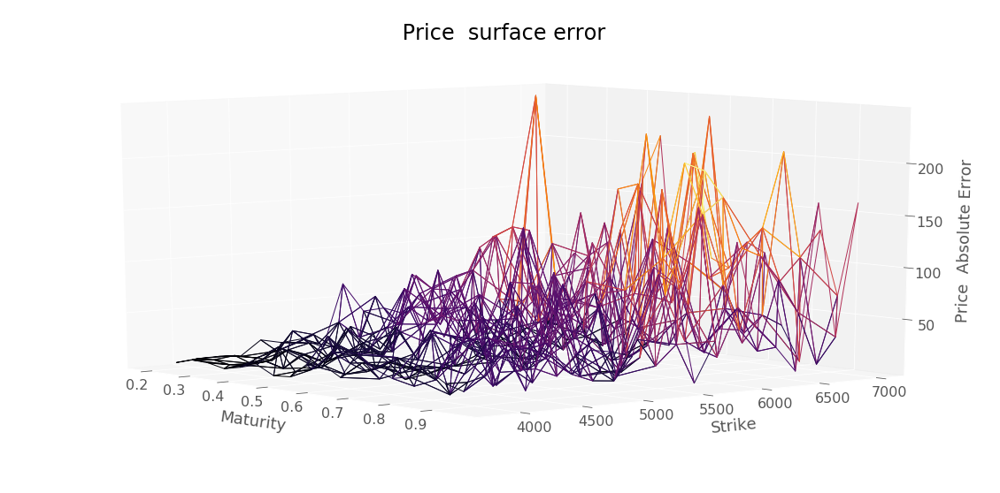

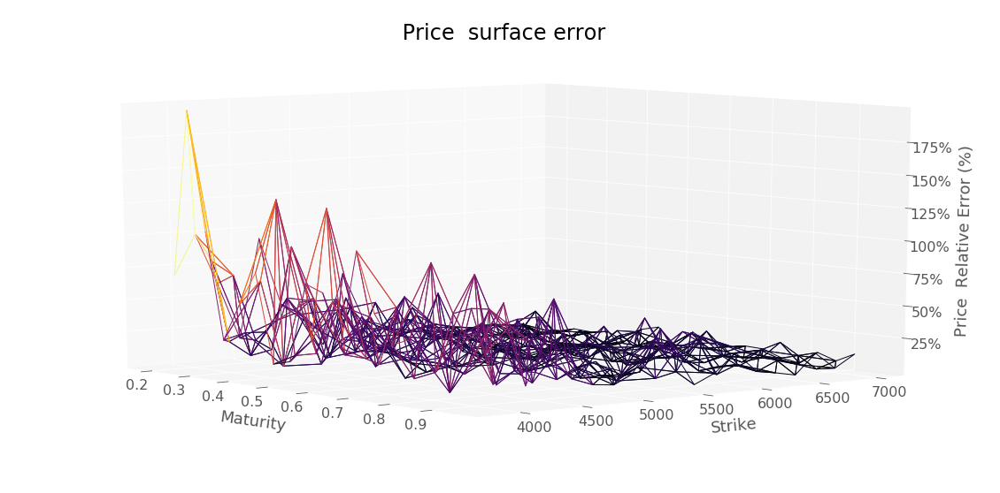

RMSE :  65.35494311648065


In [126]:
plotTools.predictionDiagnosis(mcResTikhonovTest, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [127]:
mcResTikhonovTest.to_csv(workingFolder + "mcResTikhonovTest.csv")

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


In [128]:
mcResTikhonovTrain = backtest.MonteCarloPricerVectorized(S0,
                                                         dataSet,
                                                         bootstrap,
                                                         nbPaths,
                                                         nbTimeStep,
                                                         nnVolLocaleTykhonov)
mcResTikhonovTrain.head()

Strike  Maturity
3600    0.118        0.000000
        0.367        0.000000
        0.597       21.634106
        0.866       44.849111
3800    0.118        0.000000
dtype: float64

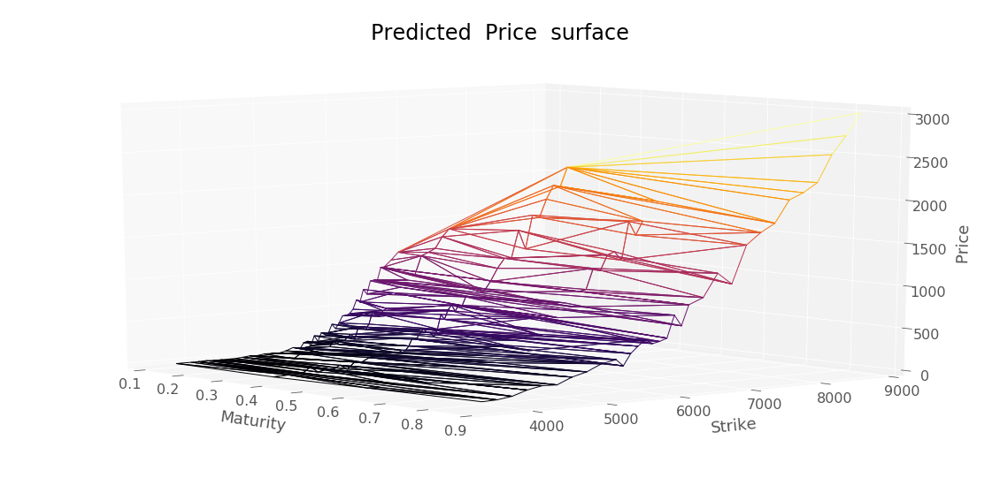

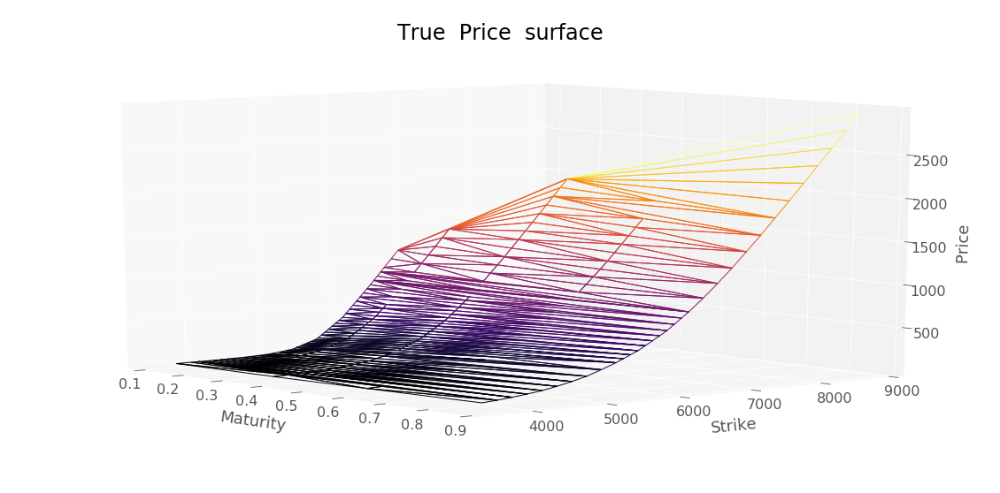

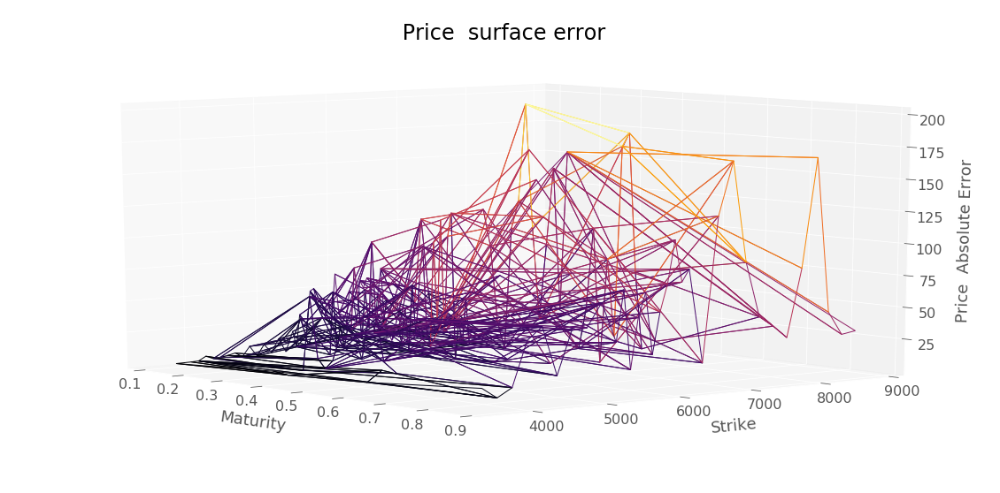

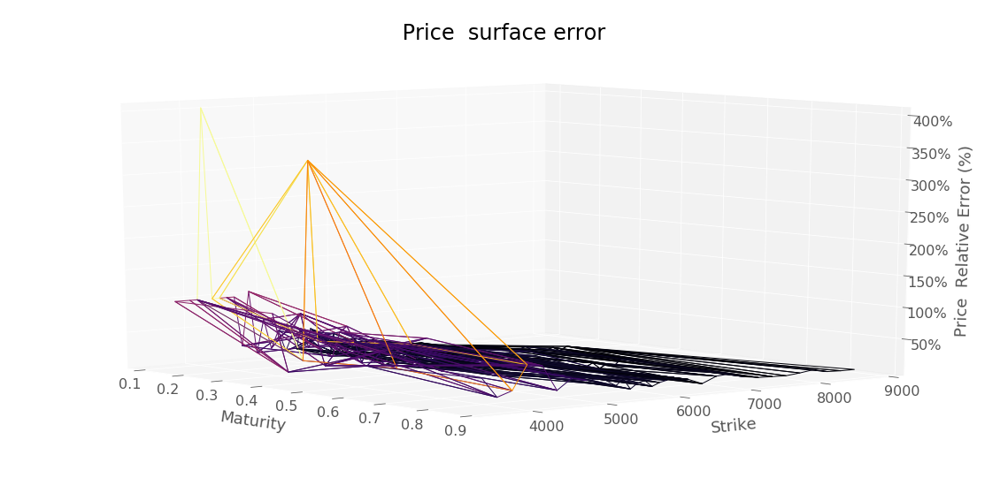

RMSE :  60.993962608159954


In [129]:
plotTools.predictionDiagnosis(mcResTikhonovTrain, 
                              dataSet["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [130]:
mcResTikhonovTrain.to_csv(workingFolder + "mcResTikhonovTrain.csv")

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


In [131]:
pdeResSigmaTikhonovTrain = backtest.PDEPricerVectorized(dataSet, S0, nnVolLocaleTykhonov, bootstrap)
pdeResSigmaTikhonovTrain.head()

KeyboardInterrupt: 

In [ ]:
plotTools.predictionDiagnosis(pdeResSigmaTikhonovTrain, 
                              dataSet["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
pdeResSigmaTikhonovTrain.to_csv(workingFolder + "pdeResSigmaTikhonovTrain.csv")

In [ ]:
pdeResSigmaTikhonovTest = backtest.PDEPricerVectorized(dataSetTest, S0, nnVolLocaleTykhonov, bootstrap)
pdeResSigmaTikhonovTest.head()

In [ ]:
plotTools.predictionDiagnosis(pdeResSigmaTikhonovTest, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
pdeResSigmaTikhonovTest.to_csv(workingFolder + "pdeResSigmaTikhonovTest.csv")

#### Backtest Local volatility SSVI 

In [ ]:
nnSSVI = lambda x,y : backtest.interpolatedMCLocalVolatility(locVolSSVIDf["LocalVolatility"], x, y)

In [ ]:
mcResSSVITest = backtest.MonteCarloPricerVectorized(S0,
                                                    dataSetTest,
                                                    bootstrap,
                                                    nbPaths,
                                                    nbTimeStep,
                                                    nnSSVI)
mcResSSVITest.head()

In [ ]:
mcResSSVITest.to_csv(workingFolder + "mcResSSVITest.csv")

In [ ]:
plotTools.predictionDiagnosis(mcResSSVITest, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
mcResSSVITrain = backtest.MonteCarloPricerVectorized(S0,
                                                     dataSet,
                                                     bootstrap,
                                                     nbPaths,
                                                     nbTimeStep,
                                                     nnSSVI)
mcResSSVITrain.head()

In [ ]:
plotTools.predictionDiagnosis(mcResSSVITrain, 
                              dataSet["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
mcResSSVITrain.to_csv(workingFolder + "mcResSSVITrain.csv")

In [ ]:
testingDataSetSSVI = backtest.interpolatedLocalVolatility(locVolSSVIDf, testingDataSet["Price"])

In [ ]:
plotTools.plotSerie(testingDataSetSSVI[testingDataSetSSVI.index.get_level_values("Maturity") > 0.01],
                    Title = 'SSVI Local Volatility Surface',
                    az=30,
                    yMin=0.0*S0,
                    yMax=2.0*S0, 
                    zAsPercent=True)

In [ ]:
pdeResSigmaSSVITrain = backtest.PDEPricerVectorized(dataSet, S0, nnSSVI, bootstrap)
pdeResSigmaSSVITrain.head()

In [ ]:
plotTools.predictionDiagnosis(pdeResSigmaSSVITrain, 
                              dataSet["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
pdeResSigmaSSVITrain.to_csv(workingFolder + "pdeResSigmaSSVITrain.csv")

In [ ]:
pdeResSigmaSSVITest = backtest.PDEPricerVectorized(dataSetTest, S0, nnSSVI, bootstrap)
pdeResSigmaSSVITest.head()

In [ ]:
plotTools.predictionDiagnosis(pdeResSigmaSSVITest, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax=KMax)

In [ ]:
pdeResSigmaSSVITest.to_csv(workingFolder + "pdeResSigmaSSVITest.csv")

#### Compute errors

In [ ]:
PriceconvexSoftGatheralVolModelTrain = backtest.loadMCPrices("PriceconvexSoftGatheralVolModelTrain.csv", 
                                                             parseHeader=0)
PriceconvexSoftGatheralVolModelTrain.head()

In [ ]:
mcResSSVITrain = backtest.loadMCPrices("mcResSSVITrain.csv")
mcResSSVITrain.head()

In [ ]:
backtest.rmse(mcResSSVITrain[2], dataSet["Price"])

In [ ]:
mcResTikhonovTrain = backtest.loadMCPrices("mcResTikhonovTrain.csv")
mcResTikhonovTrain.head()

In [ ]:
backtest.rmse(mcResTikhonovTrain[2], dataSet["Price"])

In [ ]:
mcResSigmaAreskyTrain = backtest.loadMCPrices("mcResSigmaAreskyTrain.csv")
mcResSigmaAreskyTrain.head()

In [ ]:
backtest.rmse(mcResSigmaAreskyTrain[2], dataSet["Price"])

In [ ]:
#Grid 100 points
mcResVolLocale7Train = backtest.loadMCPrices("mcResVolLocale7Train.csv",parseHeader=0)
mcResVolLocale7Train.head()

In [ ]:
backtest.rmse(mcResVolLocale7Train["0"], dataSet["Price"])

In [ ]:
backtest.rmse(mcResVolLocale7Train["0"], PriceconvexSoftGatheralVolModelTrain["Price"])

In [ ]:
#Grid test
mcResVolLocale8Train = backtest.loadMCPrices("mcResVolLocale8Train.csv",parseHeader=0)
mcResVolLocale8Train.head()

In [ ]:
backtest.rmse(mcResVolLocale8Train["0"], dataSet["Price"])

In [ ]:
backtest.rmse(mcResVolLocale8Train["0"], PriceconvexSoftGatheralVolModelTrain["Price"])

In [ ]:
PriceconvexSoftGatheralVolModelTest = backtest.loadMCPrices("PriceconvexSoftGatheralVolModelTest.csv", 
                                                            parseHeader=0)
PriceconvexSoftGatheralVolModelTest.head()

In [ ]:
mcResSSVITest = backtest.loadMCPrices("mcResSSVITest.csv")
mcResSSVITest.head()

In [ ]:
backtest.rmse(mcResSSVITest[2], dataSetTest["Price"])

In [ ]:
mcResTikhonovTest = backtest.loadMCPrices("mcResTikhonovTest.csv")
mcResTikhonovTest.head()

In [ ]:
backtest.rmse(mcResTikhonovTest[2], dataSetTest["Price"])

In [ ]:
mcResSigmaAreskyTest = backtest.loadMCPrices("mcResSigmaAreskyTest.csv")
mcResSigmaAreskyTest.head()

In [ ]:
backtest.rmse(mcResSigmaAreskyTest[2], dataSetTest["Price"])

In [ ]:
#Grid 100 points
mcResVolLocale7Test = backtest.loadMCPrices("mcResVolLocale7Test.csv",parseHeader=0)
mcResVolLocale7Test.head()

In [ ]:
backtest.rmse(mcResVolLocale7Test["0"], dataSetTest["Price"])

In [ ]:
backtest.rmse(mcResVolLocale7Test["0"], PriceconvexSoftGatheralVolModelTest["Price"])

In [ ]:
#Grid test
mcResVolLocale8Test = backtest.loadMCPrices("mcResVolLocale8Test.csv",parseHeader=0)
mcResVolLocale8Test.head()

In [ ]:
backtest.rmse(mcResVolLocale8Test["0"], dataSetTest["Price"])

In [ ]:
backtest.rmse(mcResVolLocale8Test["0"], PriceconvexSoftGatheralVolModelTest["Price"])